# Graph Coloring Algorithms

1. Greedy algorithm
2. A Graph Neural Network (GNN) based approach


The graphs are read from text files where each line represents an edge in the format:
```
e v1 v2
```
Where:
- `e` indicates this line defines an edge
- `v1` and `v2` are the vertex numbers (typically 1-indexed) that are connected by this edge

For example, a line `e 1 2` means there is an edge connecting vertex 1 and vertex 2.


In this implementation, we use PyTorch Geometric (PyG) to represent graphs:
- Vertices are represented as nodes with one-hot encoded features
- Edges are stored in an `edge_index` tensor of shape [2, num_edges], where each column represents an edge
- The first row contains source nodes, and the second row contains target nodes
- Edges are undirected by adding both directions (v1→v2 and v2→v1)

In [1]:
!pip install torch_geometric
import os
import time
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch_geometric.utils import to_networkx


[notice] A new release of pip is available: 24.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip
c:\Users\emma.sleghel\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\emma.sleghel\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
torch.manual_seed(42)
np.random.seed(42)

In [3]:
def load_graph_from_file(file_path):
    edges = []

    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 3 and parts[0] == 'e':
                v1, v2 = int(parts[1]), int(parts[2])
                edges.append([v1-1, v2-1])

    if edges:
        edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
        edge_index_reverse = torch.stack([edge_index[1], edge_index[0]], dim=0)
        edge_index = torch.cat([edge_index, edge_index_reverse], dim=1)

        num_nodes = edge_index.max().item() + 1
    else:
        edge_index = torch.tensor([], dtype=torch.long).reshape(2, 0)
        num_nodes = 0
    print(edge_index)
    return edge_index, num_nodes

In [4]:
def create_pyg_data(edge_index, num_nodes):
    x = torch.eye(num_nodes, dtype=torch.float)
    data = Data(x=x, edge_index=edge_index)
    return data

In [5]:
def visualize_graph(data, title="Graph", node_colors=None):
    G = to_networkx(data, to_undirected=True)

    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G, seed=42)

    if node_colors is not None:
        color_map = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
                     '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
        node_colors = [color_map[c % len(color_map)] for c in node_colors]
        nx.draw(G, pos, node_color=node_colors, with_labels=True, node_size=500, font_weight='bold')
    else:
        nx.draw(G, pos, with_labels=True, node_size=500, font_weight='bold')

    plt.title(title)
    plt.show()

In [6]:
example_files = [
    'test4.txt',
    'test3.txt',
    'test1.txt',
    'queen9_9.txt',
    'queen8_8.txt',
    'queen8_12.txt',
    'test2.txt',
    'queen7_7.txt',
    'queen6_6.txt',
    'queen5_5.txt',
    'queen13_13.txt',
    'queen11_11.txt',
    'myciel7.txt',
    'myciel6.txt',
    'myciel5.txt',
    'jean.txt',
    'huck.txt',
    'homer.txt',
    'games120.txt',
    'david.txt',
    'anna.txt',
    '1-Insertions_4.txt'
]
example_data = []

tensor([[  0,   0,   0,  ..., 898, 899, 899],
        [  1,   2,   3,  ..., 897, 897, 898]])
Graph 1: 900 nodes, 307350 edges


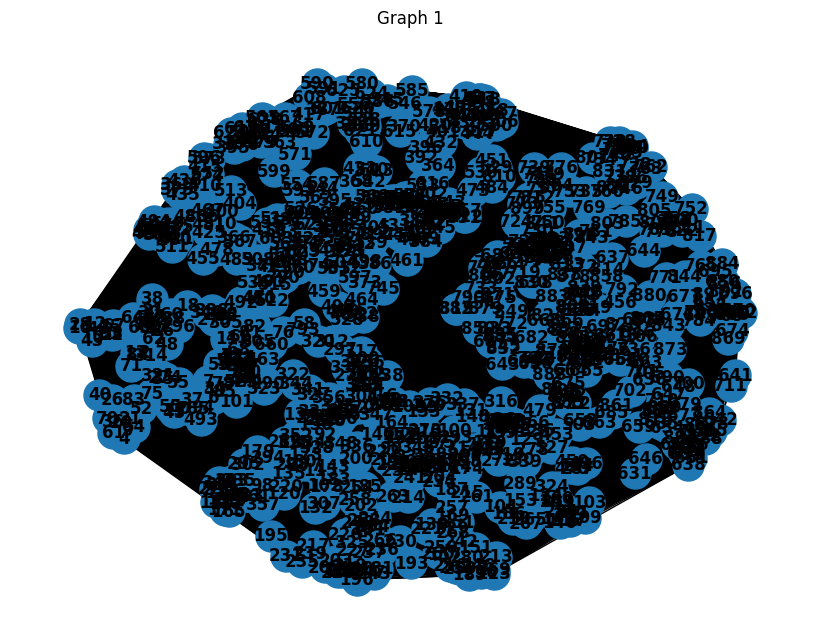

tensor([[  2,   4,   4,  ..., 992, 995, 997],
        [  0,   1,   3,  ..., 999, 999, 999]])
Graph 2: 1000 nodes, 246708 edges


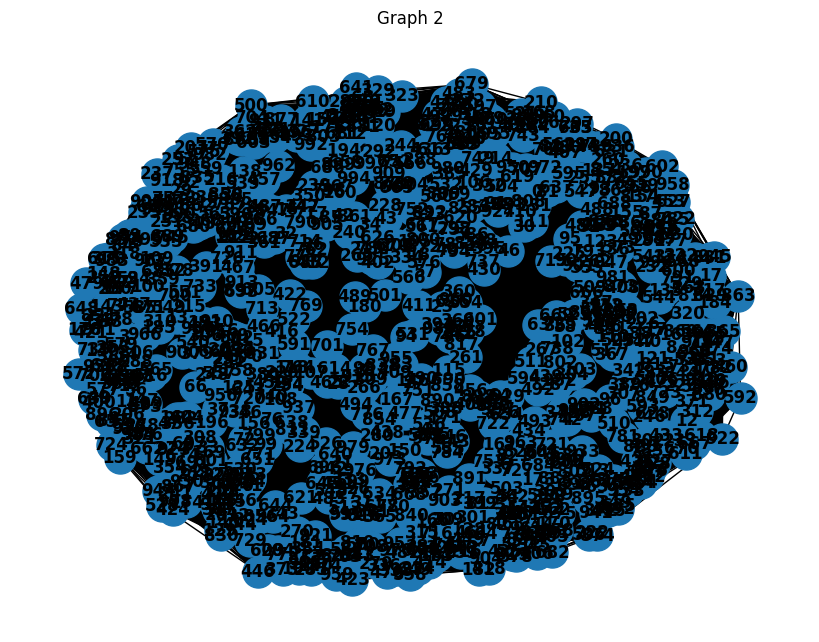

tensor([[  0,   1,   2,  ..., 117,   6,  35],
        [ 35,  44,  73,  ..., 137, 137, 137]])
Graph 3: 138 nodes, 986 edges


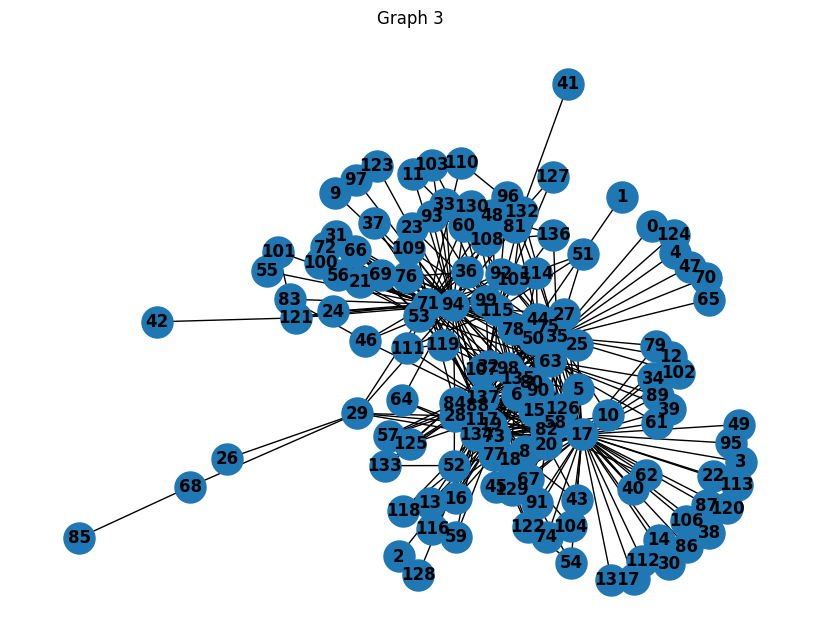

tensor([[    0,     0,     0,  ..., 20520, 20529, 20538],
        [   10,    20,    30,  ...,     0,     0,     0]])
Graph 4: 20539 nodes, 2298 edges
Graph 4: 20539 nodes, 2298 edges


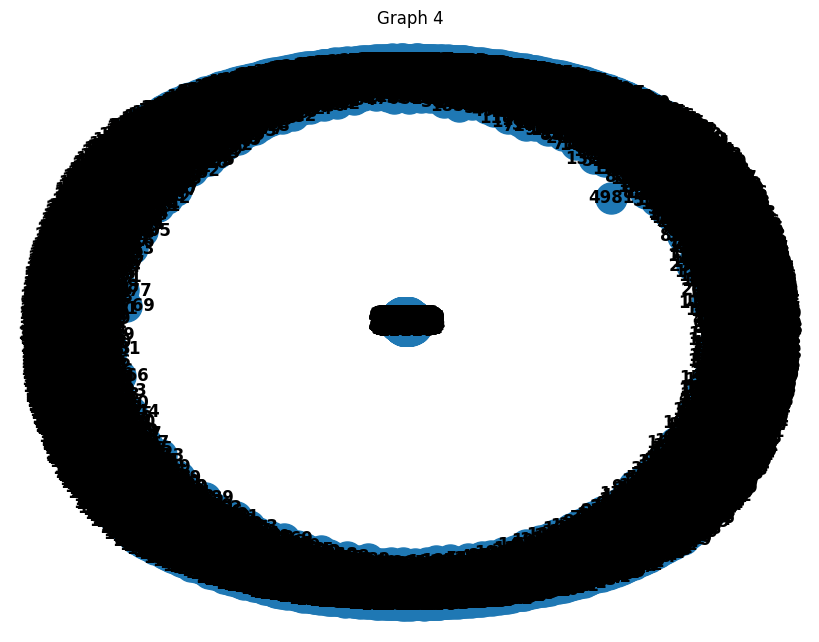

tensor([[ 0,  0,  0,  ..., 62, 63, 63],
        [ 1,  2,  3,  ..., 61, 61, 62]])
Graph 5: 64 nodes, 2016 edges


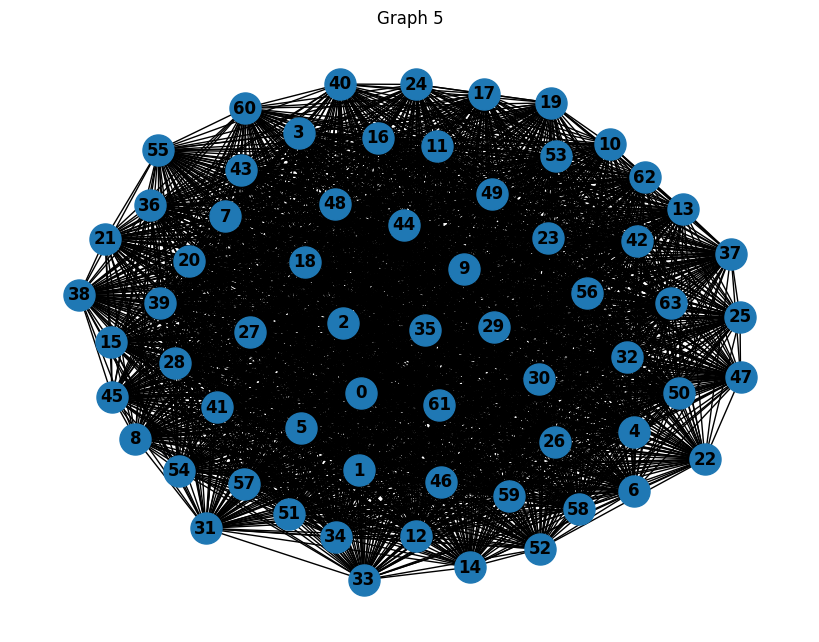

tensor([[0, 0, 1, 2],
        [1, 2, 0, 0]])
Graph 6: 3 nodes, 2 edges


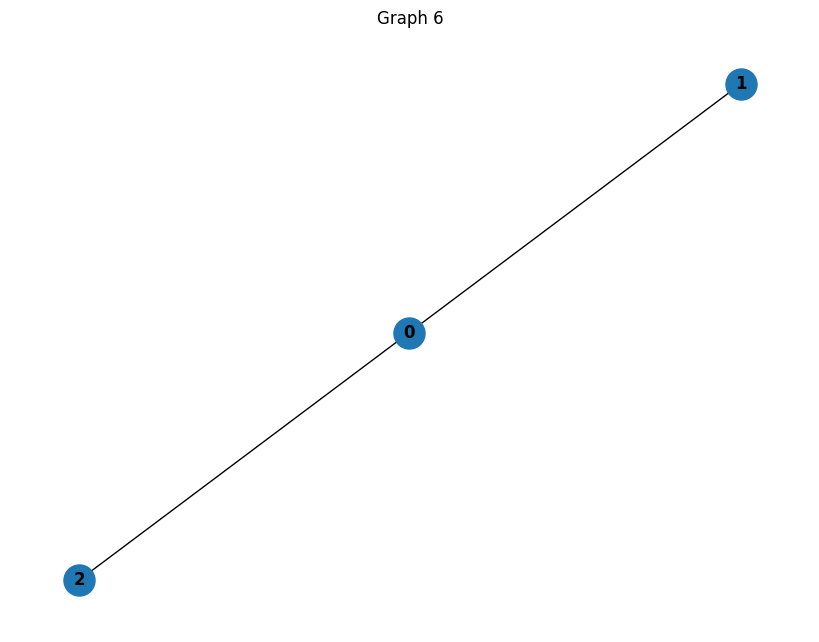

tensor([[  1,   2,   3,  ..., 490, 492, 496],
        [  0,   0,   1,  ..., 499, 499, 499]])
Graph 7: 500 nodes, 62624 edges


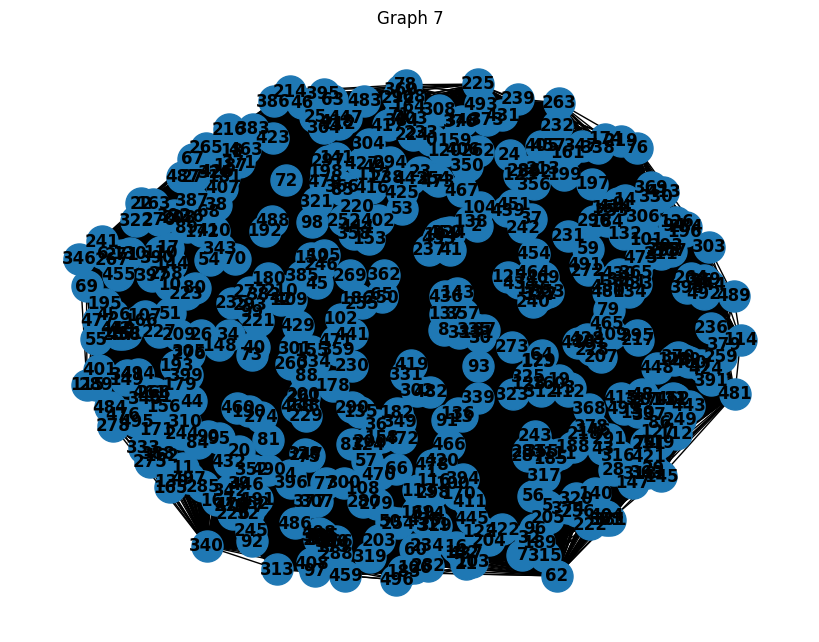

tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,  1,
          1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,
          3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,
          5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,
          7,  8,  8,  8,  8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9, 10,
         10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12,
         12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14,
         15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17,
         17, 17, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20,
         20, 20, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 23, 23, 23, 23, 23,
         24, 24, 24, 24, 24, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 27, 27, 27,
         27, 28, 28, 28, 28, 29, 29, 29, 29, 30, 30, 30, 30, 31, 31, 31, 31, 32,
         32, 32, 33, 33, 33,

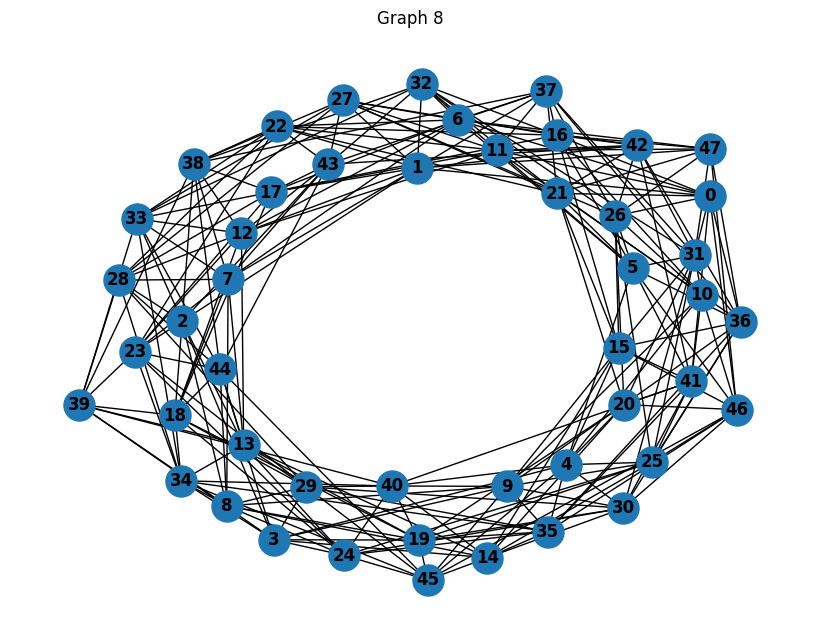

tensor([[ 0,  0,  0,  ..., 23, 24, 24],
        [ 1,  2,  3,  ..., 22, 22, 23]])
Graph 9: 25 nodes, 300 edges


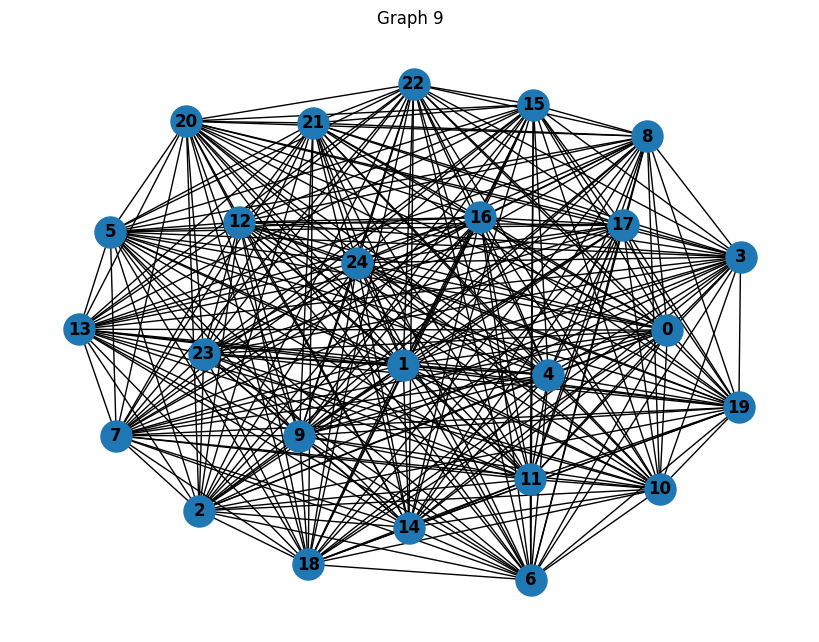

tensor([[ 0,  0,  0,  ...,  6,  4,  0],
        [ 6, 12, 18,  ..., 24, 24, 24]])
Graph 10: 25 nodes, 320 edges


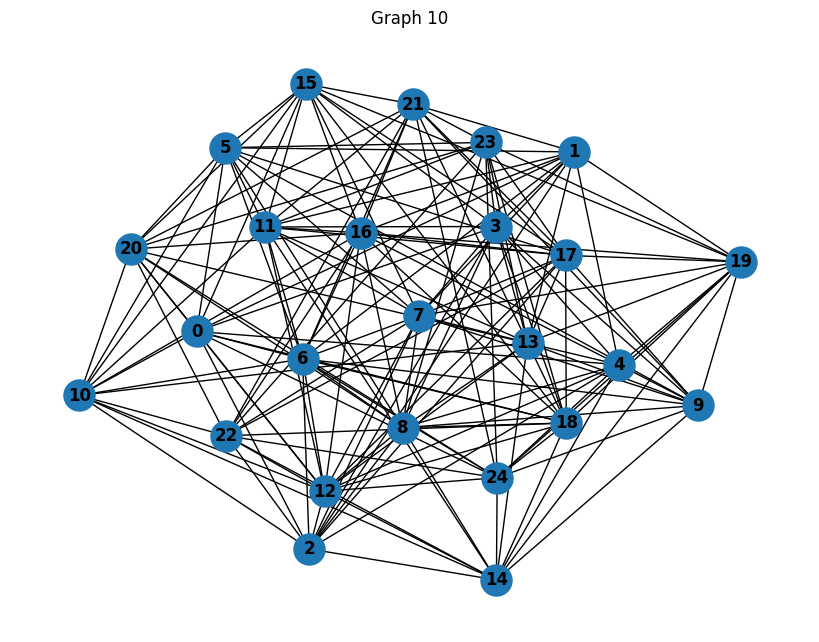

tensor([[0, 0, 1, 2],
        [1, 2, 0, 0]])
Graph 11: 3 nodes, 2 edges


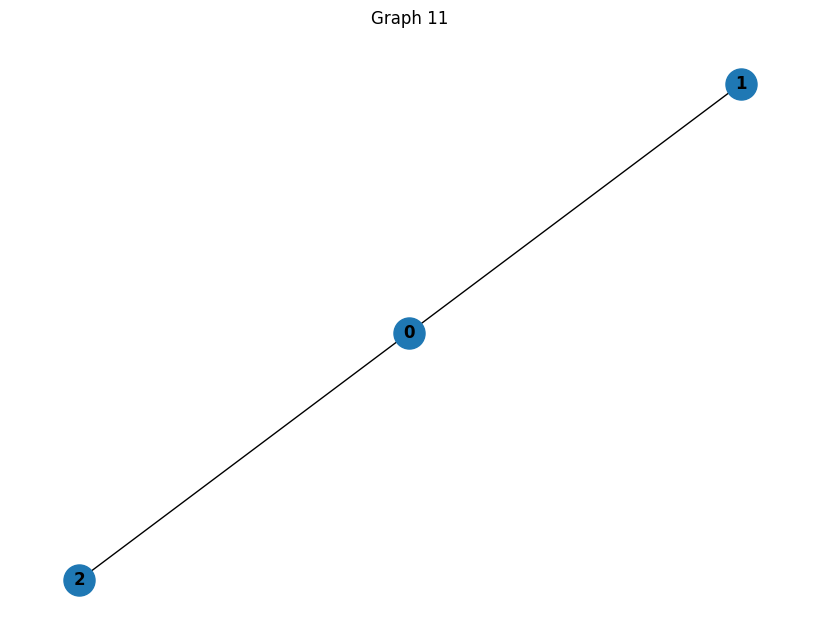

tensor([[0, 0, 1, 2],
        [1, 2, 0, 0]])
Graph 12: 3 nodes, 2 edges


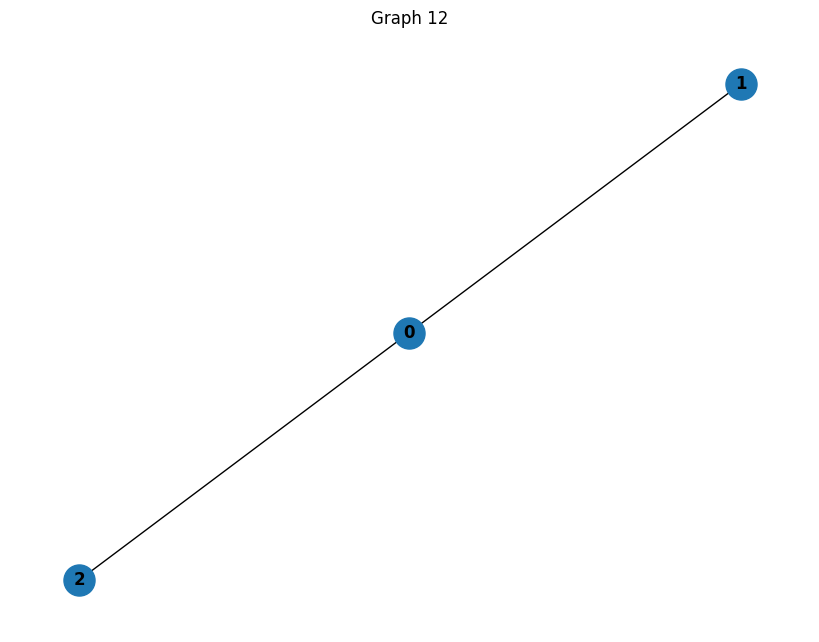

tensor([[  0,   0,   0,  ..., 172, 173, 174],
        [  1,   2,   3,  ...,  14,  14,  14]])
Graph 13: 191 nodes, 2729 edges


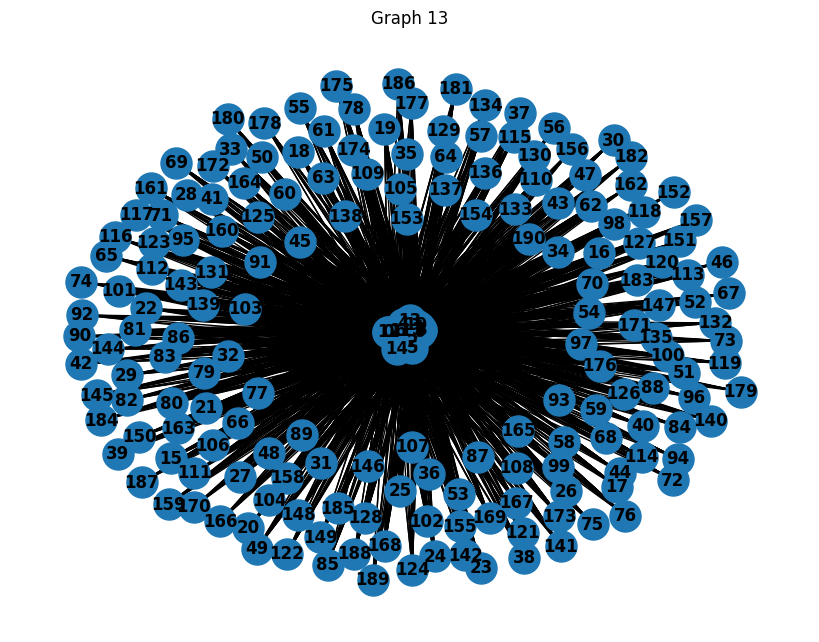

tensor([[ 0,  0,  0,  ..., 92, 93, 93],
        [ 1,  3,  6,  ..., 91, 91, 92]])
Graph 14: 95 nodes, 1636 edges


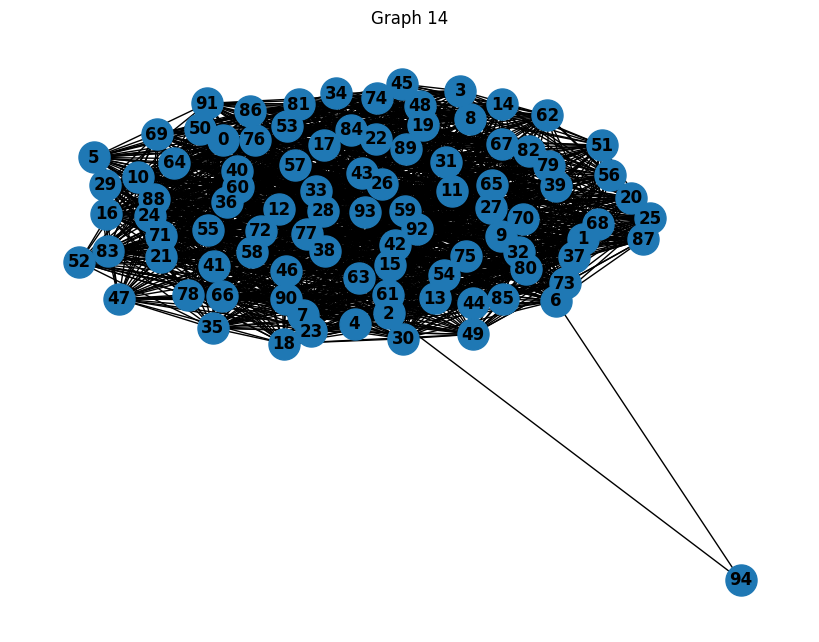

tensor([[ 0,  0,  0,  ..., 45, 46, 46],
        [ 1,  2,  3,  ..., 44, 44, 45]])
Graph 15: 47 nodes, 1081 edges


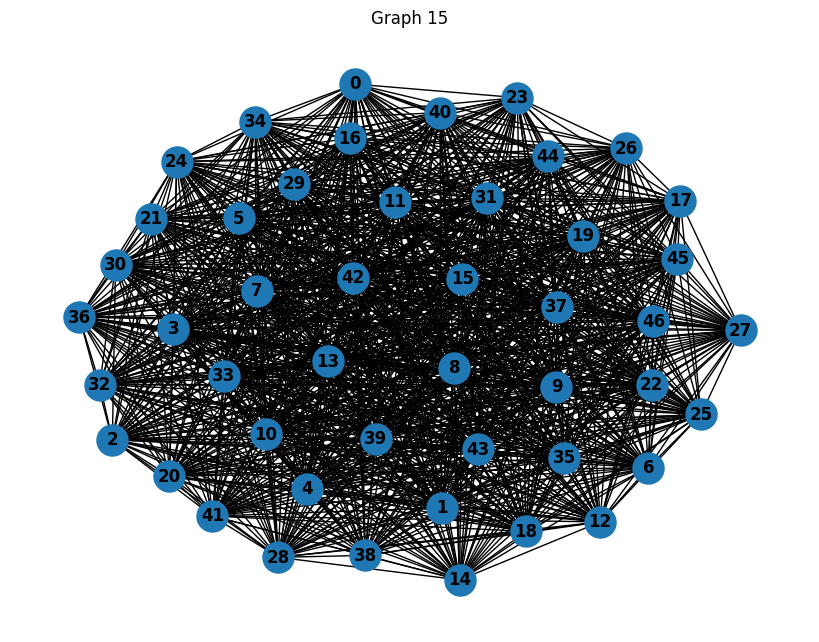

tensor([[ 0,  1,  1,  ..., 78, 79, 79],
        [13, 36, 74,  ..., 77, 77, 78]])
Graph 16: 80 nodes, 1495 edges


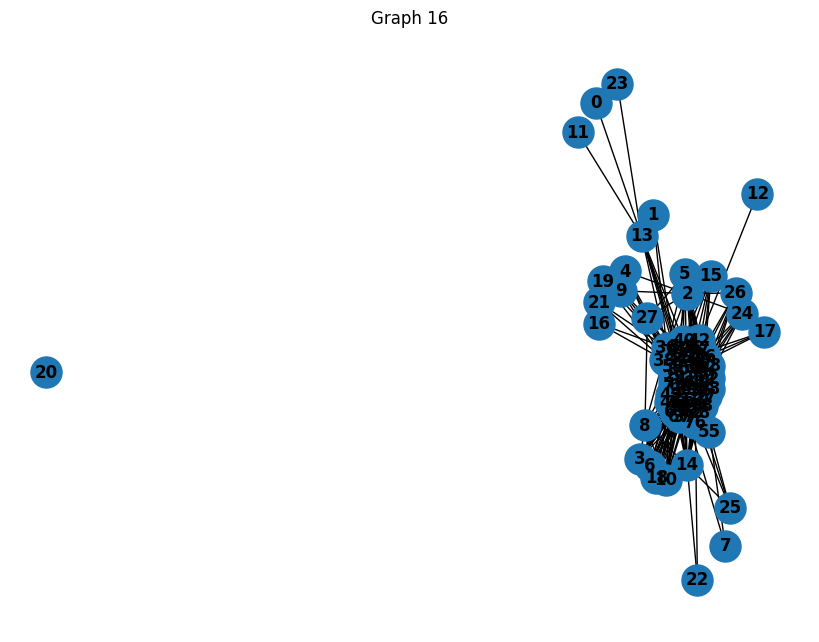

tensor([[ 0,  0,  0,  ..., 72, 73, 73],
        [ 1,  2,  3,  ..., 71, 71, 72]])
Graph 17: 74 nodes, 2701 edges


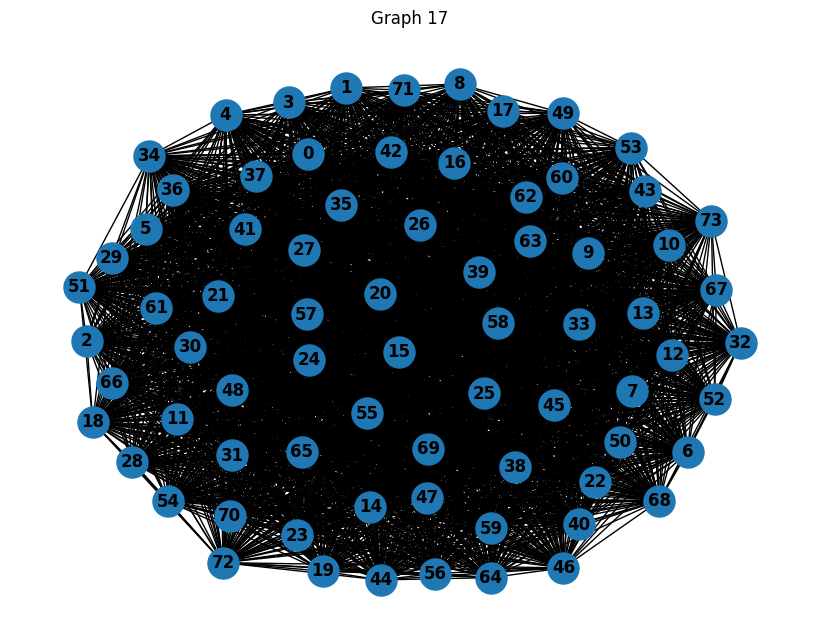

tensor([[0, 0, 1, 2],
        [1, 2, 0, 0]])
Graph 18: 3 nodes, 2 edges


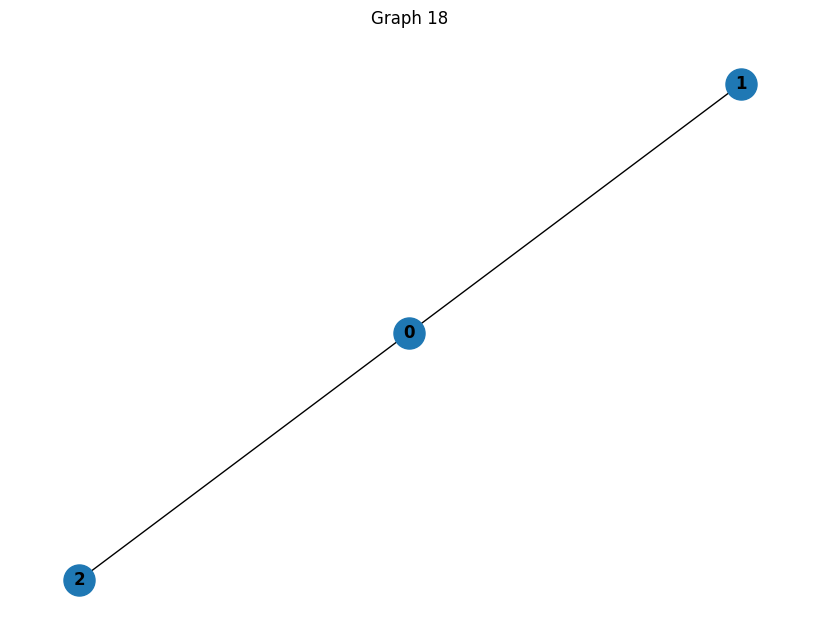

tensor([[0, 0, 1, 2],
        [1, 2, 0, 0]])
Graph 19: 3 nodes, 2 edges


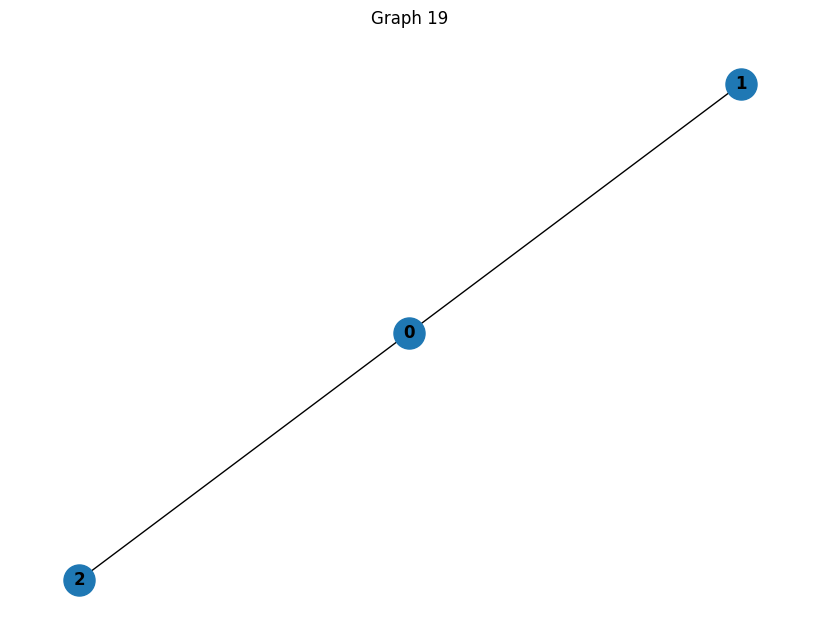

tensor([[  0,   0,   0,  ..., 808, 809, 810],
        [ 19,  13,   3,  ...,   2,   2,   2]])
Graph 20: 811 nodes, 800 edges


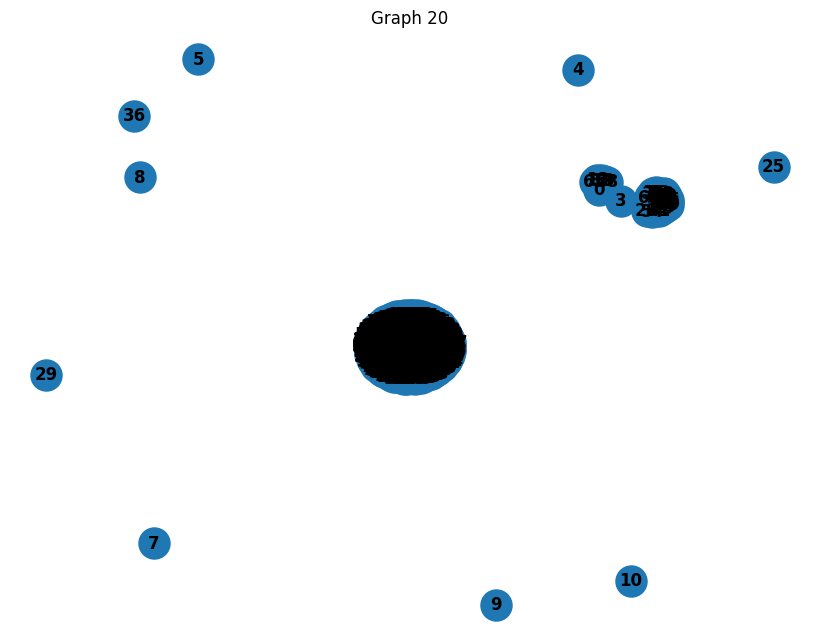

tensor([[0, 0, 1, 2],
        [1, 2, 0, 0]])
Graph 21: 3 nodes, 2 edges


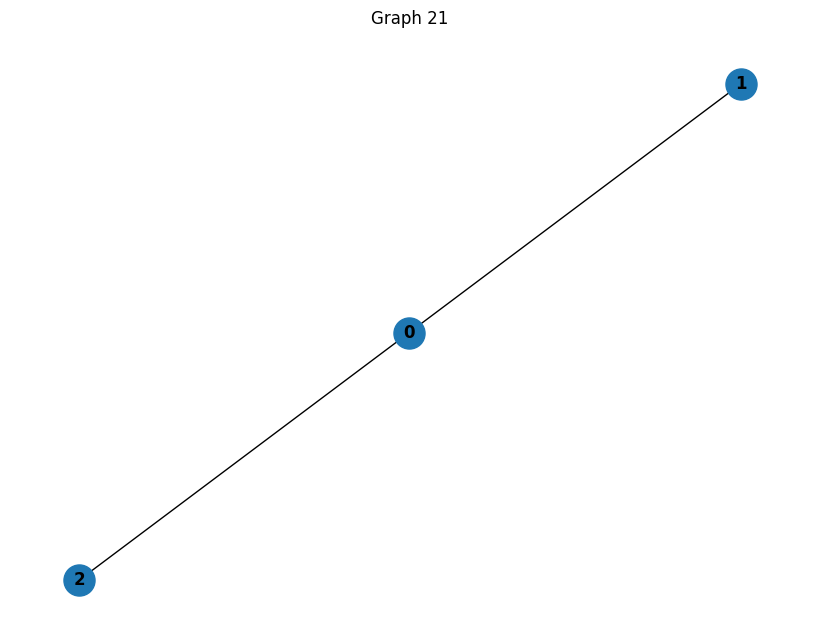

tensor([[0, 1, 2, 3, 4, 5, 1, 2, 3, 4, 5, 6],
        [1, 2, 3, 4, 5, 6, 0, 1, 2, 3, 4, 5]])
Graph 22: 7 nodes, 6 edges


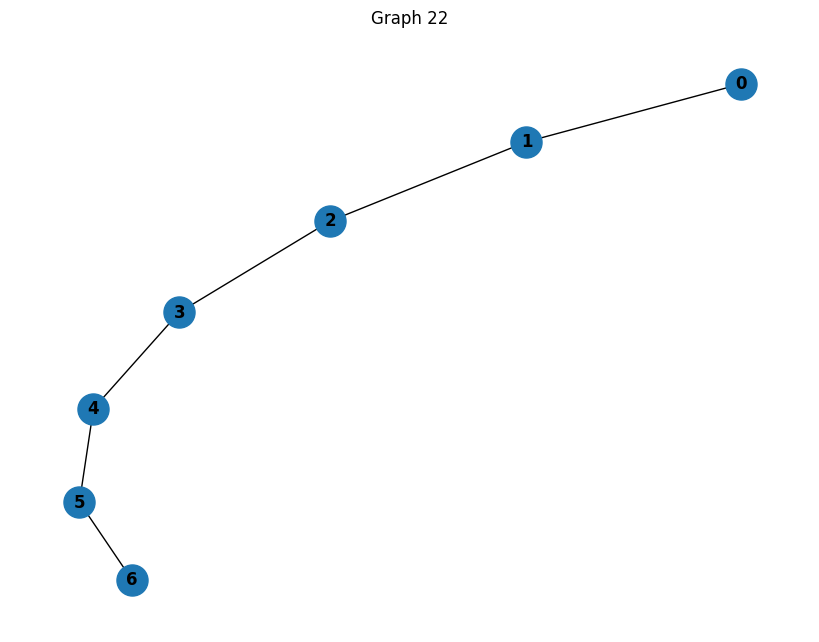

In [7]:
for i, file_path in enumerate(example_files):
    edge_index, num_nodes = load_graph_from_file(file_path)
    data = create_pyg_data(edge_index, num_nodes)
    example_data.append(data)

    print(f"Graph {i+1}: {num_nodes} nodes, {edge_index.shape[1]//2} edges")
    visualize_graph(data, title=f"Graph {i+1}")

## Greedy Graph Coloring Algorithm

1. Sort nodes by degree (number of connections) in descending order
2. For each node, assign the smallest color (starting from 0) that is not used by any of its neighbors


In [8]:
def greedy_coloring(data):
    G = to_networkx(data, to_undirected=True)
    colors = {}
    nodes_by_degree = sorted(G.nodes(), key=lambda n: G.degree(n), reverse=True)

    for node in nodes_by_degree:
        neighbor_colors = {colors[neighbor] for neighbor in G.neighbors(node) if neighbor in colors}

        color = 0
        while color in neighbor_colors:
            color += 1

        colors[node] = color

    color_list = [colors[i] for i in range(len(G.nodes()))]
    num_colors = len(set(color_list))

    return color_list, num_colors

Graph 1 - Greedy coloring uses 213 colors
Color assignments: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 1, 0, 3, 2, 5, 4, 7, 6, 90, 10, 9, 12, 11, 14, 13, 16, 15, 91, 19, 18, 21, 20, 23, 22, 25, 24, 92, 28, 27, 30, 29, 32, 31, 34, 33, 93, 37, 36, 39, 38, 41, 40, 43, 42, 94, 46, 45, 48, 47, 50, 49, 52, 51, 95, 55, 54, 57, 56, 59, 58, 61, 60, 96, 64, 63, 66, 65, 68, 67, 70, 69, 97, 73, 72, 75, 74, 77, 76, 79, 78, 98, 82, 81, 84, 83, 86, 85, 88, 87, 99, 2, 3, 0, 1, 6, 7, 4, 5, 100, 11, 12, 9, 10, 15, 16, 13, 14, 101, 20, 21, 18, 19, 24, 25, 22, 23, 102, 29, 30, 27, 28, 33, 34, 31, 32, 103, 38, 39, 36, 37, 42, 43, 40, 41, 104, 47, 48, 45, 46, 51, 52, 49, 50, 105, 56, 57, 54, 55, 60, 61, 

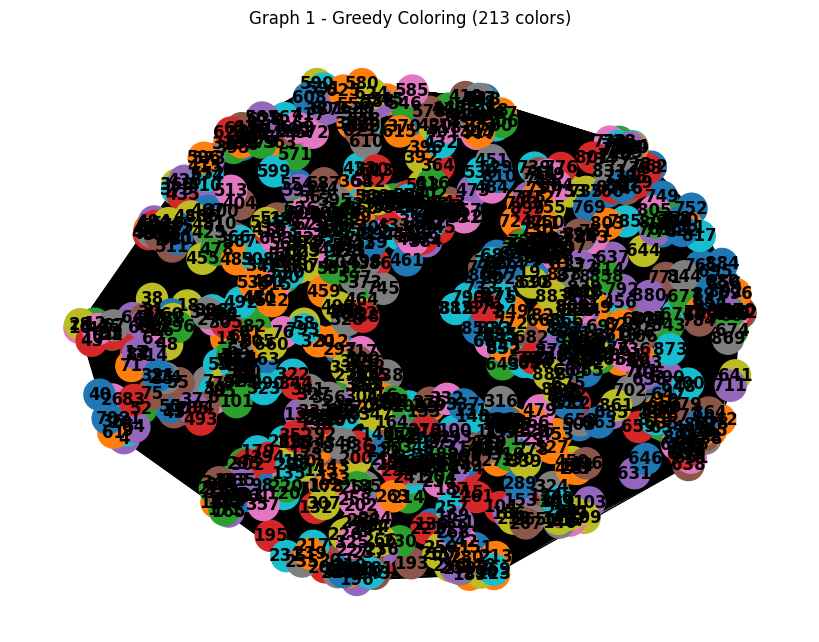

Graph 2 - Greedy coloring uses 123 colors
Color assignments: [6, 69, 68, 14, 71, 47, 73, 111, 103, 8, 77, 93, 79, 25, 71, 3, 1, 16, 34, 18, 78, 85, 25, 18, 53, 72, 92, 14, 4, 39, 49, 8, 50, 38, 2, 58, 86, 65, 88, 115, 61, 84, 10, 67, 68, 62, 36, 21, 67, 93, 37, 8, 20, 107, 52, 60, 40, 40, 64, 95, 103, 31, 59, 99, 37, 91, 15, 6, 94, 39, 38, 49, 17, 34, 27, 74, 34, 79, 20, 94, 6, 106, 60, 19, 119, 8, 22, 2, 83, 56, 78, 21, 13, 96, 44, 95, 16, 55, 101, 82, 31, 103, 29, 17, 83, 35, 76, 100, 93, 48, 61, 20, 77, 77, 21, 37, 72, 5, 69, 2, 79, 50, 39, 52, 114, 5, 121, 97, 40, 2, 6, 46, 44, 32, 2, 42, 81, 52, 3, 88, 30, 50, 23, 57, 32, 73, 67, 41, 40, 22, 35, 89, 11, 111, 51, 77, 12, 100, 99, 106, 42, 72, 96, 8, 17, 80, 30, 99, 112, 31, 4, 105, 120, 26, 56, 67, 15, 37, 110, 101, 42, 104, 109, 44, 89, 70, 35, 21, 7, 84, 63, 0, 27, 22, 8, 85, 32, 109, 48, 70, 11, 85, 73, 0, 111, 30, 79, 104, 15, 55, 52, 104, 56, 71, 119, 25, 34, 115, 33, 108, 13, 86, 45, 38, 87, 33, 88, 112, 100, 108, 40, 88, 72,

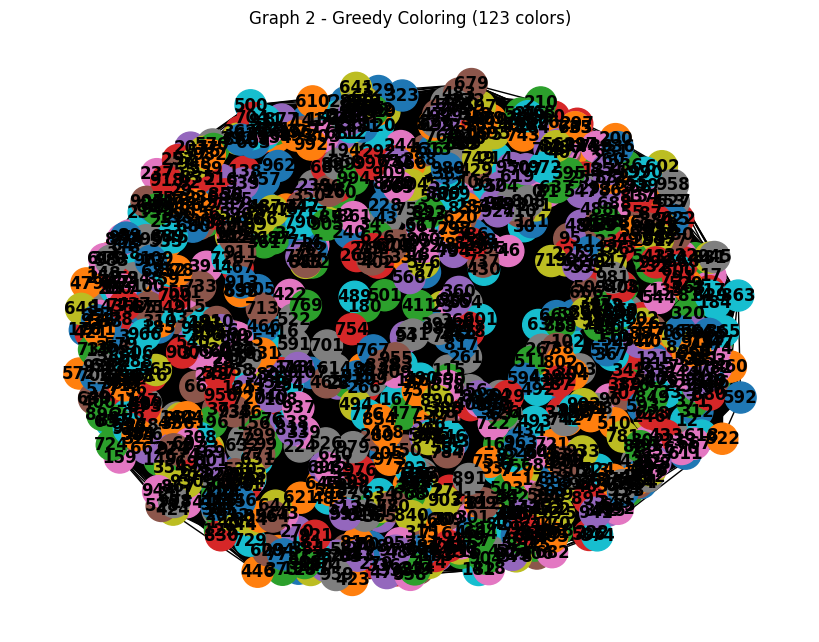

Graph 3 - Greedy coloring uses 11 colors
Color assignments: [0, 0, 0, 1, 0, 5, 2, 1, 1, 1, 2, 1, 2, 0, 1, 2, 0, 0, 4, 7, 2, 1, 1, 0, 1, 4, 1, 2, 1, 0, 1, 0, 6, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 4, 2, 0, 0, 1, 1, 4, 0, 1, 0, 1, 0, 2, 1, 2, 0, 0, 2, 1, 3, 0, 0, 1, 1, 1, 1, 0, 4, 5, 3, 1, 5, 3, 1, 3, 2, 9, 1, 7, 1, 7, 0, 1, 1, 2, 2, 10, 4, 0, 4, 2, 2, 1, 0, 8, 3, 6, 0, 3, 3, 1, 3, 1, 8, 1, 0, 1, 0, 1, 1, 3, 7, 1, 3, 0, 1, 1, 0, 2, 1, 0, 0, 2, 1, 0, 4, 2, 2, 0, 0, 4, 6, 0, 5]


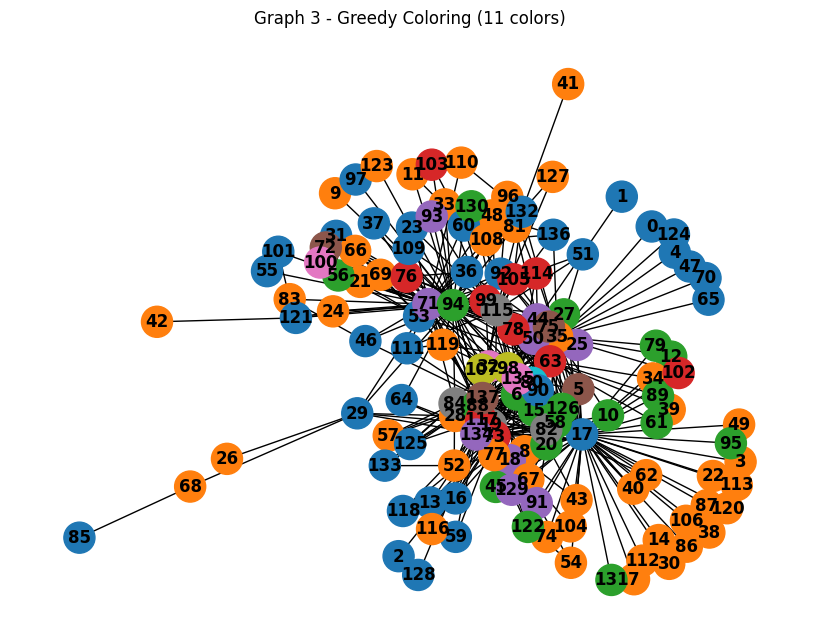

Graph 4 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0

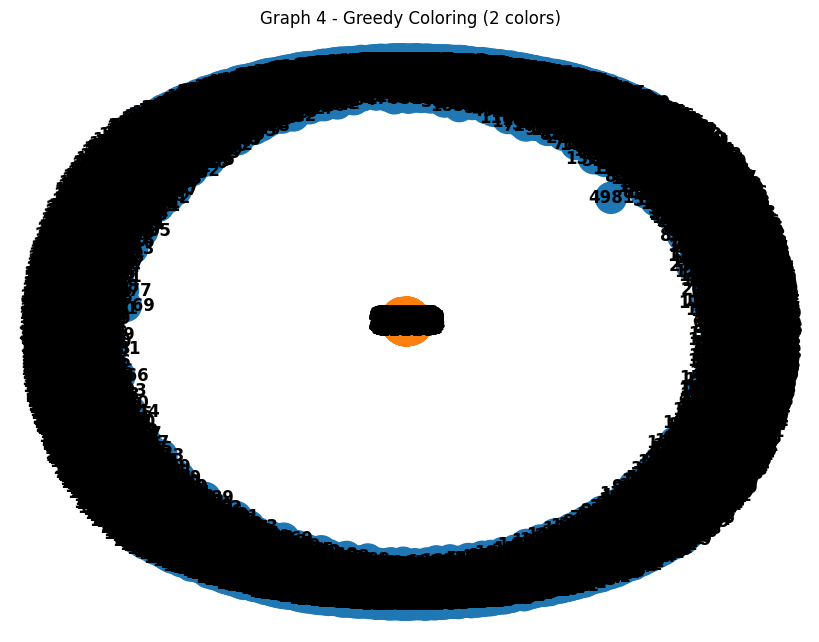

Graph 5 - Greedy coloring uses 64 colors
Color assignments: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]


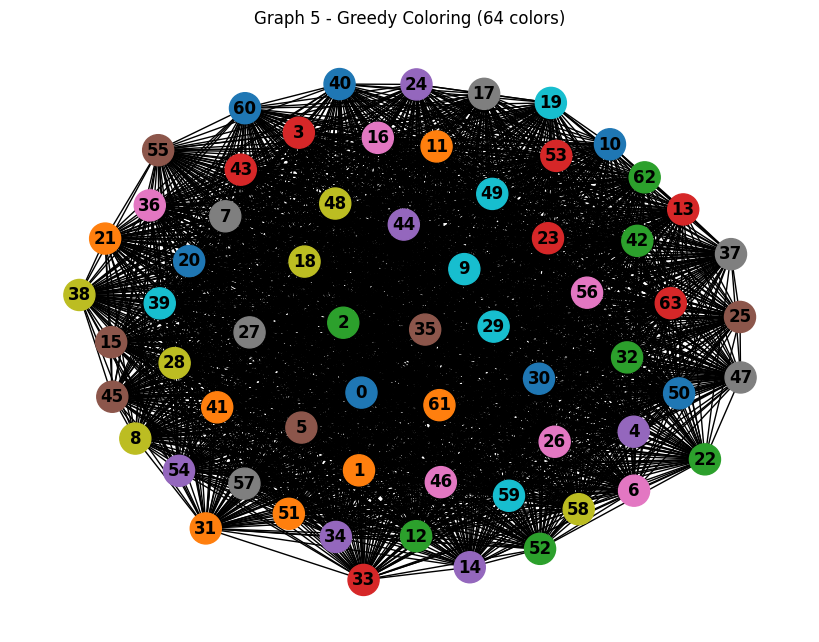

Graph 6 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1]


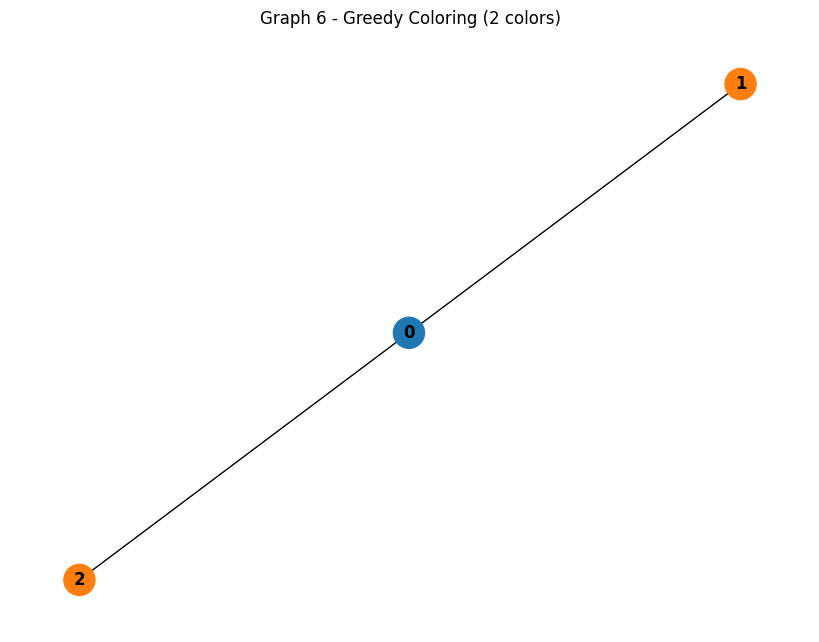

Graph 7 - Greedy coloring uses 71 colors
Color assignments: [1, 18, 16, 3, 17, 11, 41, 55, 8, 36, 49, 27, 32, 1, 12, 20, 44, 44, 49, 47, 26, 39, 53, 28, 48, 21, 24, 13, 47, 58, 4, 31, 55, 6, 0, 43, 2, 26, 29, 16, 10, 45, 5, 34, 19, 47, 8, 58, 47, 32, 19, 24, 42, 5, 54, 63, 45, 41, 55, 30, 25, 40, 54, 50, 2, 7, 30, 62, 52, 19, 3, 37, 61, 27, 63, 17, 59, 16, 69, 32, 18, 34, 52, 15, 12, 3, 19, 64, 35, 1, 11, 11, 50, 63, 64, 27, 15, 43, 18, 23, 28, 0, 32, 57, 23, 9, 32, 59, 49, 53, 0, 27, 7, 22, 51, 28, 41, 35, 42, 17, 46, 58, 14, 35, 29, 37, 57, 37, 36, 28, 57, 5, 20, 41, 7, 3, 60, 7, 17, 55, 8, 13, 23, 30, 64, 19, 30, 61, 30, 46, 1, 34, 6, 54, 48, 4, 49, 6, 13, 18, 7, 50, 49, 66, 39, 59, 12, 58, 44, 5, 44, 40, 2, 15, 48, 51, 19, 26, 31, 3, 63, 22, 4, 12, 20, 39, 31, 30, 57, 66, 8, 8, 22, 21, 10, 65, 43, 38, 33, 25, 0, 53, 24, 23, 44, 52, 5, 25, 27, 44, 45, 6, 24, 26, 42, 20, 15, 68, 11, 62, 2, 20, 60, 28, 29, 59, 38, 4, 36, 12, 43, 6, 67, 10, 9, 12, 57, 0, 42, 46, 19, 70, 22, 22, 33, 16,

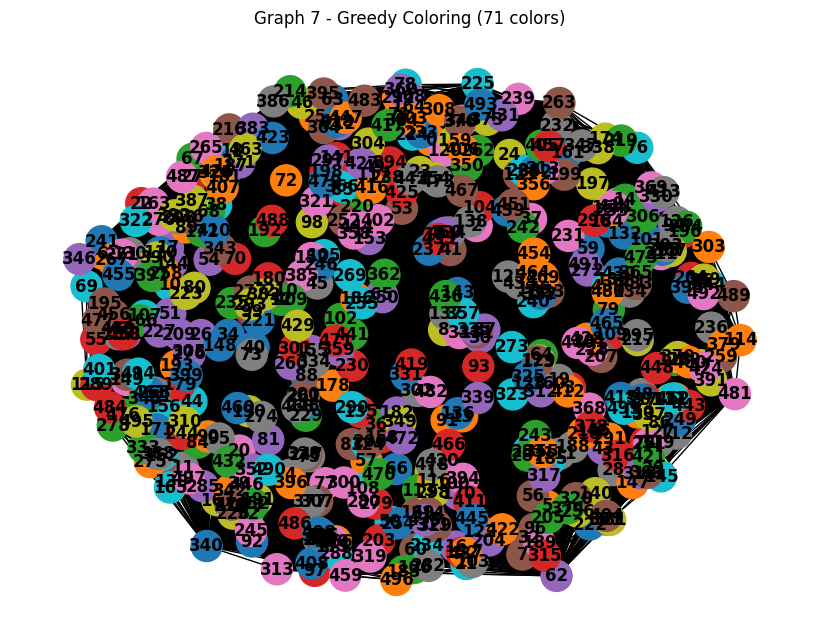

Graph 8 - Greedy coloring uses 3 colors
Color assignments: [1, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1, 0, 1, 2, 0, 1]


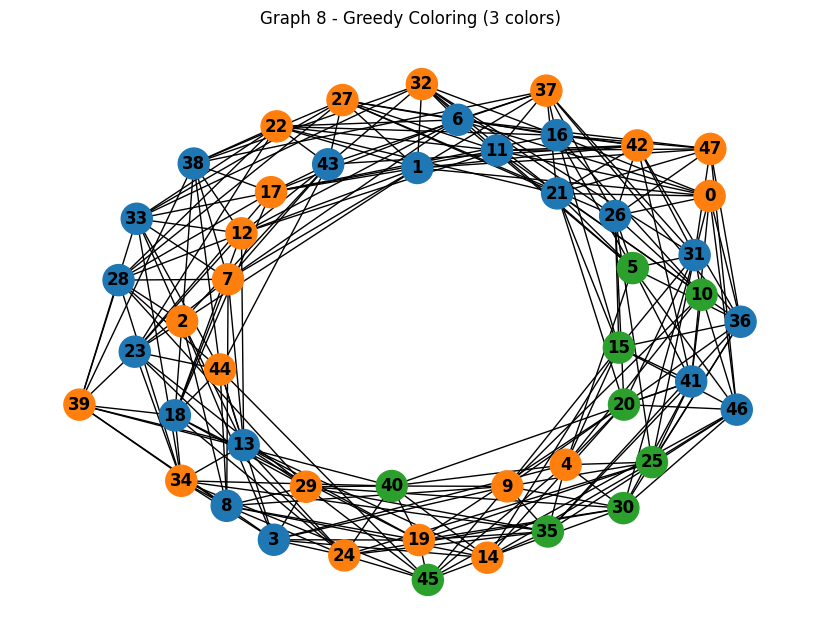

Graph 9 - Greedy coloring uses 25 colors
Color assignments: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


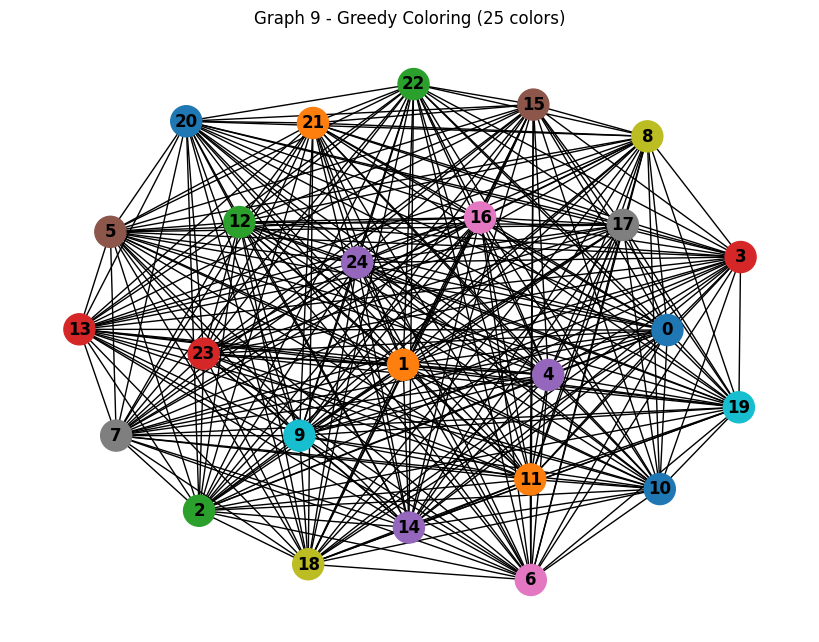

Graph 10 - Greedy coloring uses 7 colors
Color assignments: [2, 0, 5, 4, 1, 5, 1, 2, 3, 0, 4, 3, 0, 1, 2, 0, 2, 4, 5, 3, 6, 5, 1, 0, 4]


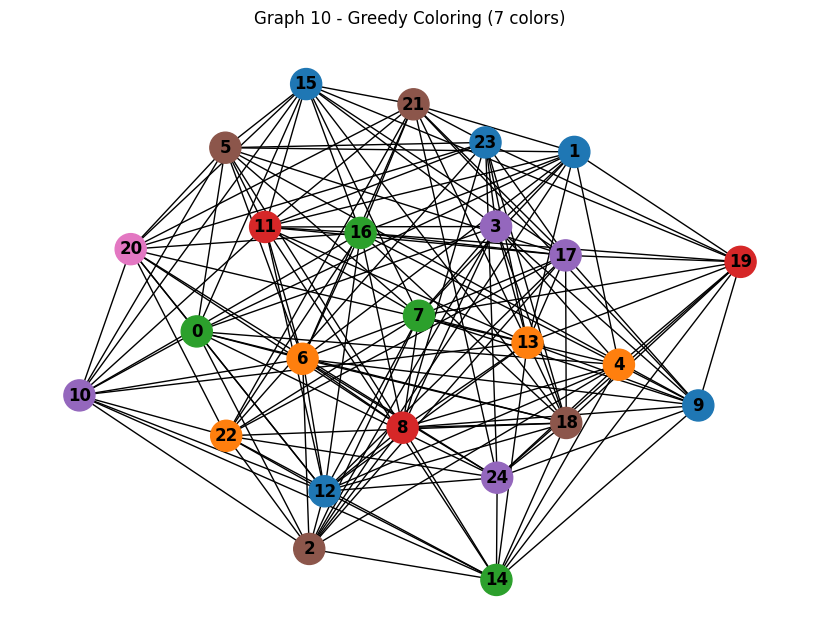

Graph 11 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1]


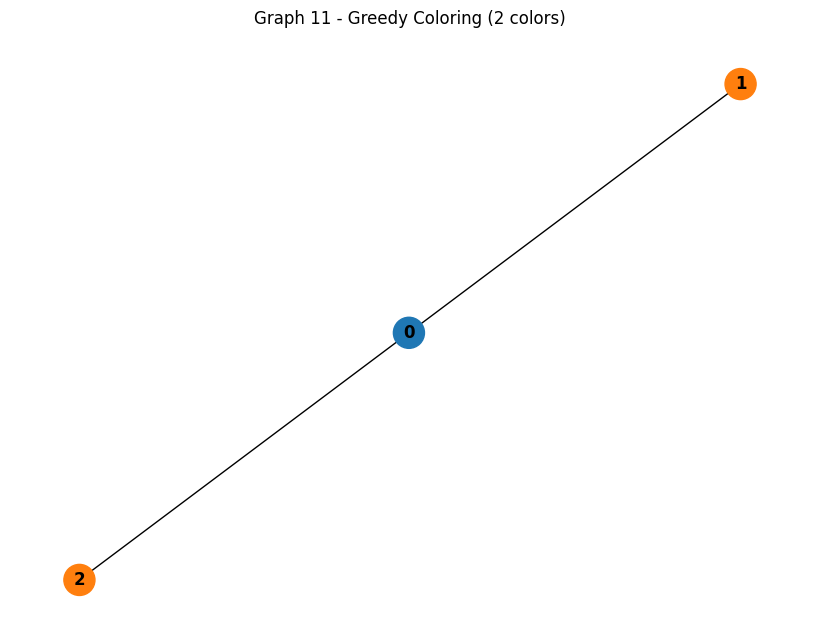

Graph 12 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1]


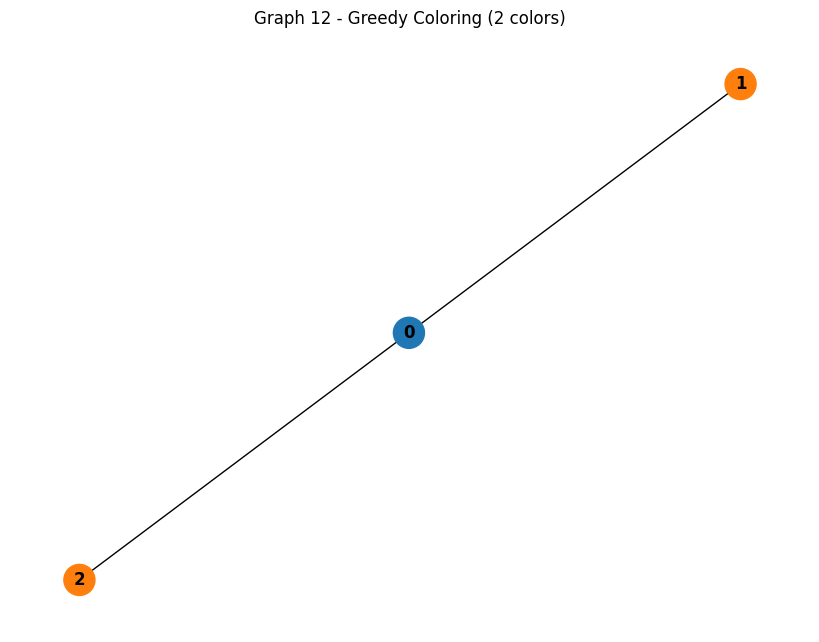

Graph 13 - Greedy coloring uses 16 colors
Color assignments: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14]


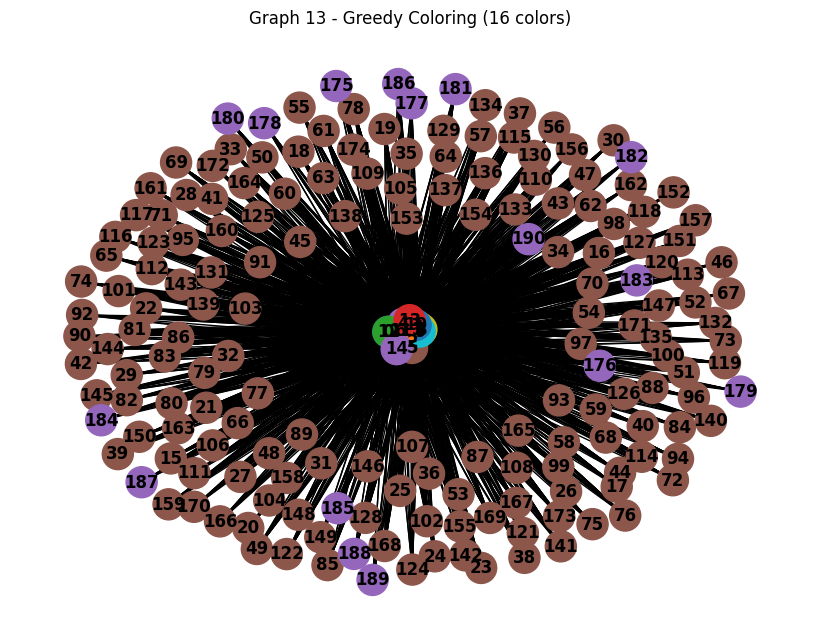

Graph 14 - Greedy coloring uses 14 colors
Color assignments: [8, 1, 6, 0, 2, 5, 2, 6, 1, 3, 1, 6, 1, 7, 5, 2, 8, 1, 6, 1, 4, 8, 3, 12, 3, 4, 7, 5, 10, 6, 9, 7, 5, 7, 6, 1, 4, 3, 4, 8, 1, 0, 2, 4, 8, 6, 7, 13, 5, 2, 5, 2, 9, 2, 6, 1, 6, 5, 3, 4, 3, 4, 8, 9, 2, 3, 4, 6, 5, 7, 5, 10, 8, 9, 11, 10, 11, 4, 11, 4, 10, 3, 7, 3, 9, 8, 2, 11, 3, 7, 5, 9, 1, 0, 0]


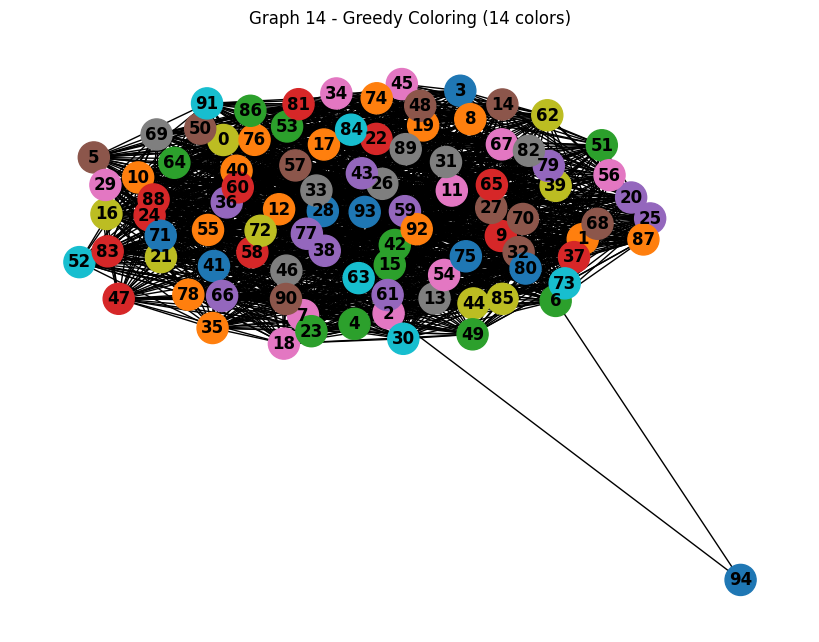

Graph 15 - Greedy coloring uses 47 colors
Color assignments: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]


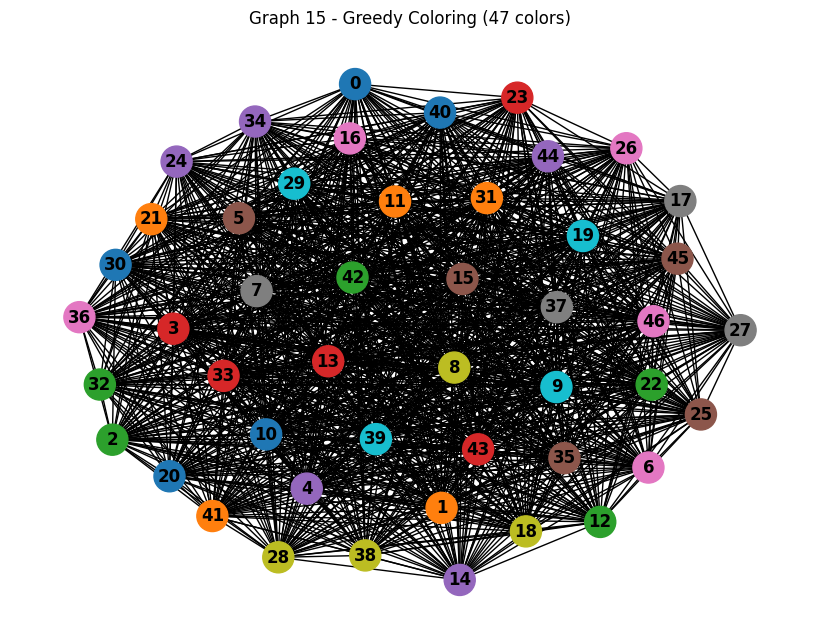

Graph 16 - Greedy coloring uses 51 colors
Color assignments: [0, 2, 1, 7, 2, 2, 0, 2, 6, 3, 0, 0, 0, 1, 8, 0, 1, 0, 11, 4, 0, 5, 0, 0, 0, 0, 2, 0, 23, 29, 44, 30, 11, 5, 12, 45, 0, 7, 8, 19, 31, 32, 33, 24, 46, 34, 9, 13, 47, 10, 48, 49, 50, 35, 20, 0, 6, 21, 14, 25, 36, 37, 15, 38, 26, 2, 39, 3, 16, 40, 41, 1, 17, 42, 22, 27, 18, 43, 4, 28]


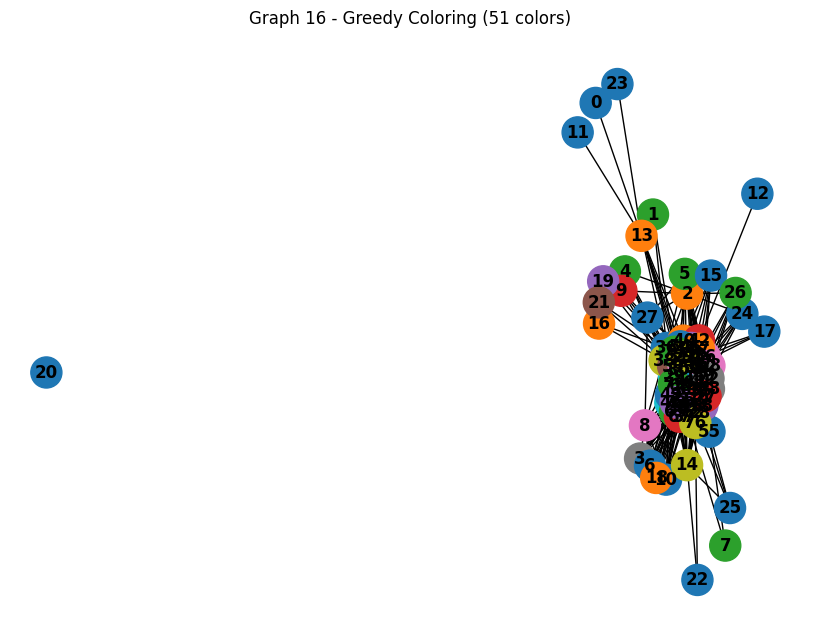

Graph 17 - Greedy coloring uses 74 colors
Color assignments: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73]


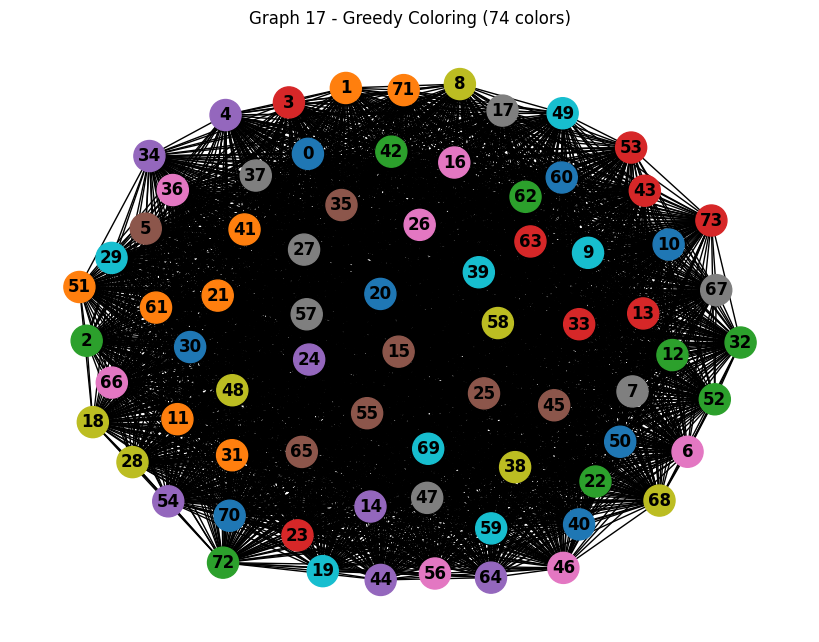

Graph 18 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1]


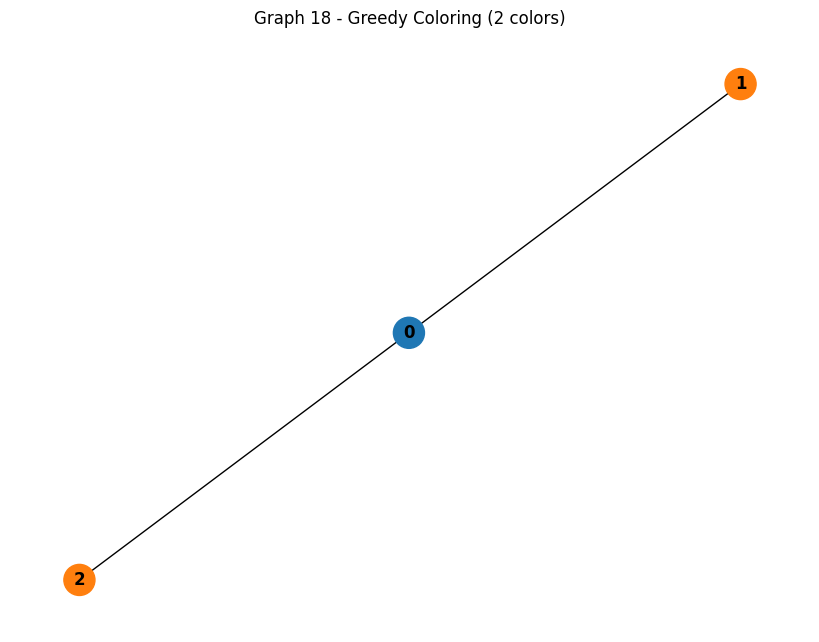

Graph 19 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1]


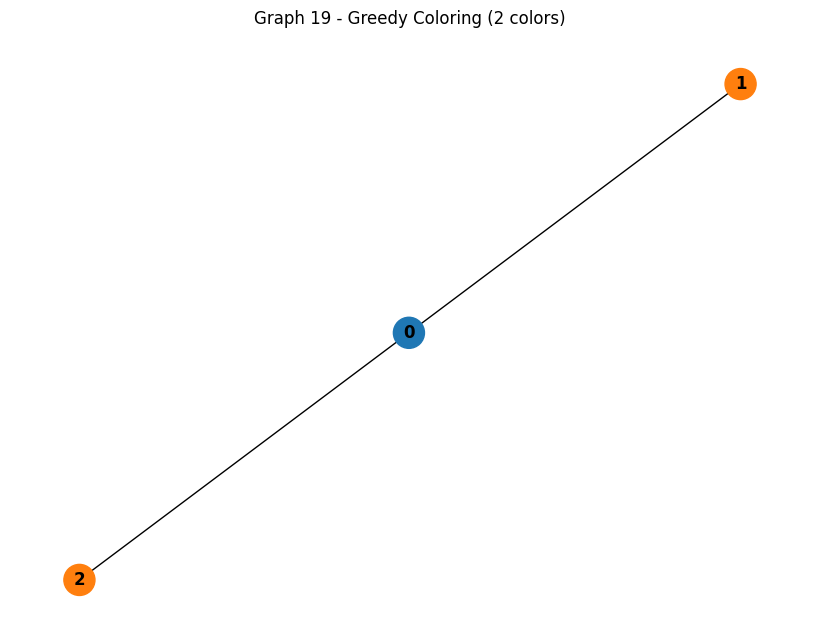

Graph 20 - Greedy coloring uses 2 colors
Color assignments: [0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

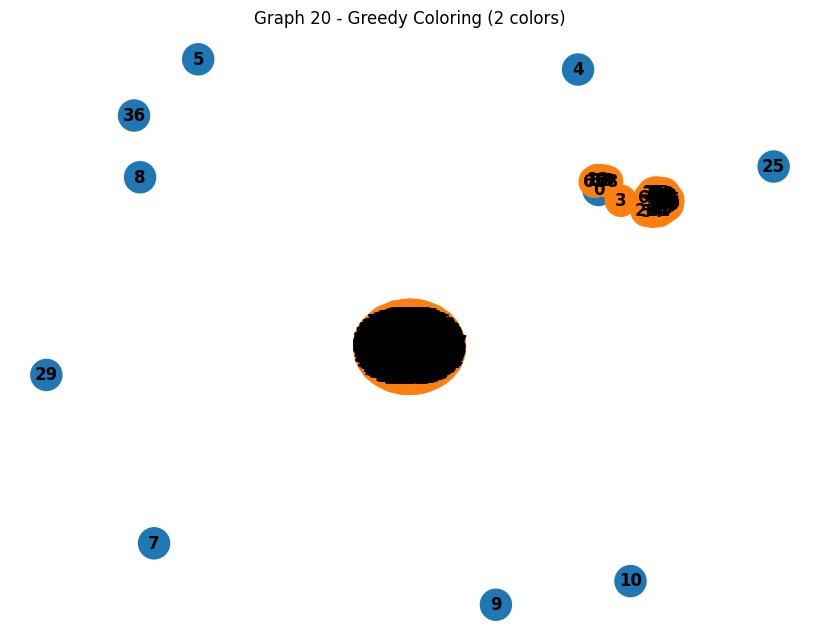

Graph 21 - Greedy coloring uses 2 colors
Color assignments: [0, 1, 1]


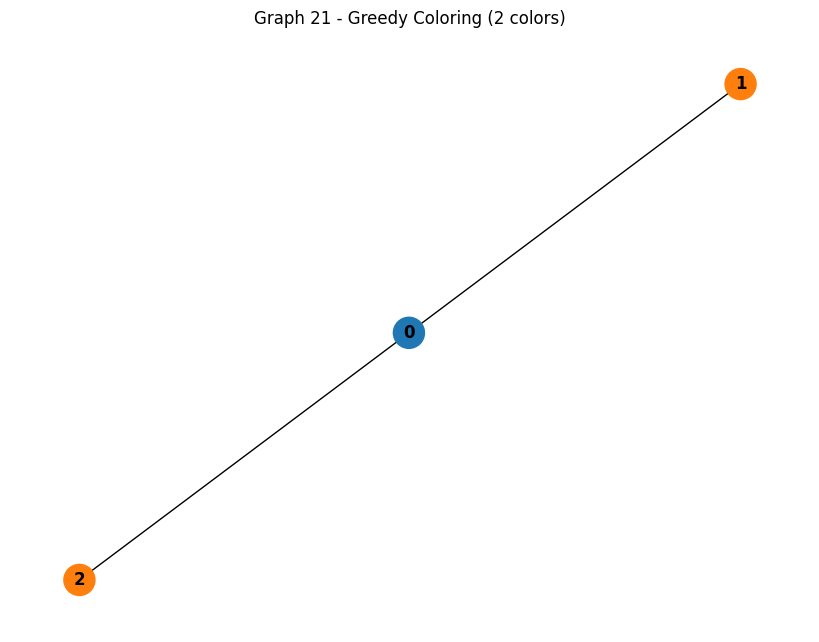

Graph 22 - Greedy coloring uses 2 colors
Color assignments: [1, 0, 1, 0, 1, 0, 1]


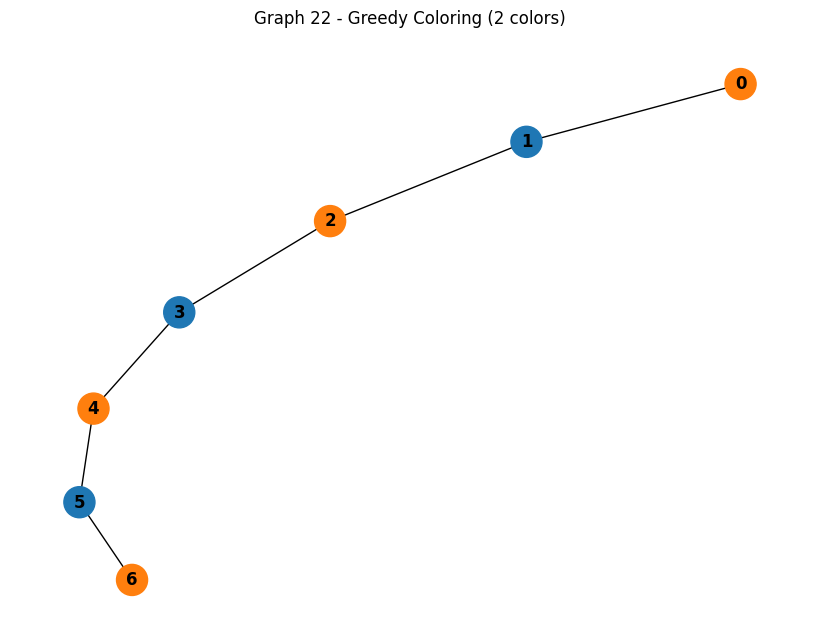

In [9]:
for i, data in enumerate(example_data):
    colors, num_colors = greedy_coloring(data)
    print(f"Graph {i+1} - Greedy coloring uses {num_colors} colors")
    print(f"Color assignments: {colors}")
    visualize_graph(data, title=f"Graph {i+1} - Greedy Coloring ({num_colors} colors)", node_colors=colors)

## Graph Neural Network (GNN)

1. Three Graph Convolutional Network (GCN) layers
2. Two fully connected layers to predict color probabilities
3. A custom prediction method that ensures no adjacent nodes have the same color

In [10]:
class GNNColoringModel(nn.Module):
    def __init__(self, in_channels, hidden_channels, max_colors=10):
        super(GNNColoringModel, self).__init__()
        self.max_colors = max_colors

        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels)
        self.conv3 = GCNConv(hidden_channels, hidden_channels)

        self.lin1 = nn.Linear(hidden_channels, hidden_channels)
        self.lin2 = nn.Linear(hidden_channels, max_colors)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.2, training=self.training)

        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.2, training=self.training)

        x = self.conv3(x, edge_index)
        x = F.relu(x)

        x = self.lin1(x)
        x = F.relu(x)
        x = self.lin2(x)
        return x

    def predict_colors(self, x, edge_index):
        self.eval()
        with torch.no_grad():
            logits = self(x, edge_index)
            print(logits)
            edge_list = edge_index.t().tolist()
            G = nx.Graph()
            G.add_nodes_from(range(x.size(0)))
            G.add_edges_from(edge_list)

            color_prefs = F.softmax(logits, dim=1).cpu().numpy()
            print(color_prefs)

            colors = {}
            nodes_by_degree = sorted(G.nodes(), key=lambda n: G.degree(n), reverse=True)

            for node in nodes_by_degree:
                neighbor_colors = {colors[neighbor] for neighbor in G.neighbors(node) if neighbor in colors}
                node_prefs = np.argsort(-color_prefs[node])

                for color in node_prefs:
                    if color not in neighbor_colors:
                        colors[node] = int(color)
                        break
                else:
                    color = 0
                    while color in neighbor_colors:
                        color += 1
                    colors[node] = color

            color_list = [colors[i] for i in range(len(G.nodes()))]
            return color_list

## Custom Loss Function
 **Adjacency Loss**: Penalizes when connected nodes have similar color probabilities
   - For each edge (src, dst), we calculate the dot product of their color probability distributions
   - Higher dot product means more similar distributions (bad for graph coloring)
   - We want connected nodes to have different colors, so we minimize this similarity

In [11]:
def coloring_loss(logits, edge_index, diversity_weight=0.1):
    probs = F.softmax(logits, dim=1)
    src, dst = edge_index
    src_probs = probs[src]
    dst_probs = probs[dst]

    similarity = torch.sum(src_probs * dst_probs, dim=1)

    adjacency_loss = similarity.mean()

    total_loss = adjacency_loss

    return total_loss

In [12]:
def train_gnn_coloring(data, hidden_channels=64, max_colors=10, epochs=200, lr=0.01):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = GNNColoringModel(data.x.size(1), hidden_channels, max_colors).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    data = data.to(device)
    losses = []

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        logits = model(data.x, data.edge_index)
        loss = coloring_loss(logits, data.edge_index)
        loss.backward()
        optimizer.step()

        losses.append(loss.item())

        if (epoch + 1) % 20 == 0:
            print(f'Epoch {epoch+1:03d}, Loss: {loss.item():.4f}')

    return model, losses


Training GNN for Graph 1


Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 11705.6727 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 11705.6727 seconds


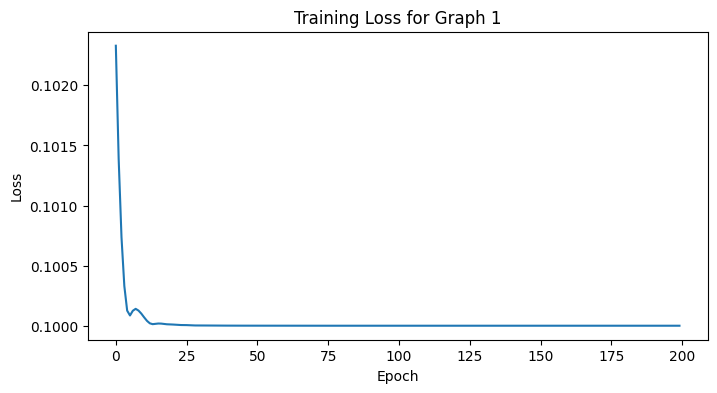

tensor([[0.0098, 0.0098, 0.0097,  ..., 0.0097, 0.0098, 0.0099],
        [0.0098, 0.0098, 0.0097,  ..., 0.0097, 0.0098, 0.0099],
        [0.0098, 0.0098, 0.0097,  ..., 0.0097, 0.0098, 0.0099],
        ...,
        [0.0098, 0.0098, 0.0097,  ..., 0.0097, 0.0098, 0.0099],
        [0.0098, 0.0098, 0.0097,  ..., 0.0097, 0.0098, 0.0099],
        [0.0098, 0.0098, 0.0097,  ..., 0.0097, 0.0098, 0.0099]])
[[0.1000085  0.10000369 0.09999672 ... 0.09999545 0.10000268 0.10001158]
 [0.1000085  0.10000369 0.09999672 ... 0.09999544 0.10000268 0.10001158]
 [0.1000085  0.10000368 0.09999672 ... 0.09999545 0.10000267 0.10001157]
 ...
 [0.10000844 0.10000373 0.09999673 ... 0.09999545 0.10000265 0.10001156]
 [0.10000845 0.10000372 0.09999673 ... 0.09999544 0.10000265 0.10001156]
 [0.10000847 0.10000373 0.09999674 ... 0.09999546 0.10000266 0.10001156]]
GNN coloring for Graph 1 uses 207 colors
Color assignments: [9, 0, 1, 8, 5, 4, 3, 2, 7, 6, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,

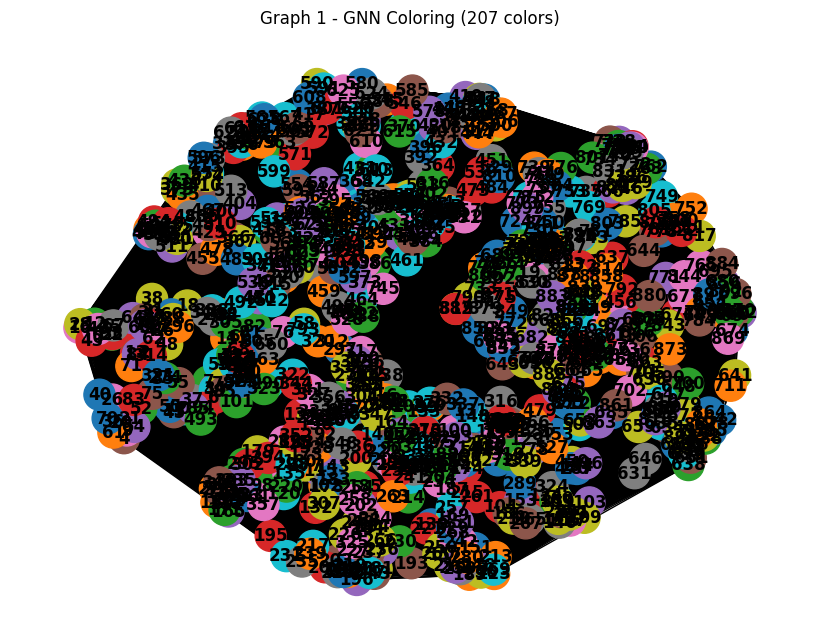


Training GNN for Graph 2
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 31.6941 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 31.6941 seconds


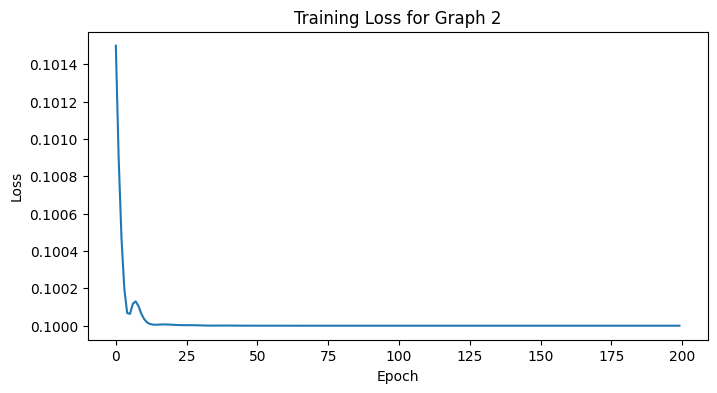

tensor([[-0.0072, -0.0072, -0.0072,  ..., -0.0072, -0.0072, -0.0072],
        [-0.0072, -0.0072, -0.0072,  ..., -0.0072, -0.0072, -0.0072],
        [-0.0072, -0.0072, -0.0072,  ..., -0.0072, -0.0072, -0.0072],
        ...,
        [-0.0072, -0.0072, -0.0072,  ..., -0.0072, -0.0072, -0.0072],
        [-0.0072, -0.0071, -0.0072,  ..., -0.0072, -0.0072, -0.0072],
        [-0.0072, -0.0072, -0.0072,  ..., -0.0072, -0.0072, -0.0072]])
[[0.09999673 0.09999924 0.09999929 ... 0.10000121 0.09999928 0.1000004 ]
 [0.09999653 0.0999979  0.0999992  ... 0.10000154 0.09999885 0.10000025]
 [0.09999669 0.09999888 0.09999928 ... 0.10000131 0.09999917 0.10000037]
 ...
 [0.09999628 0.09999621 0.0999991  ... 0.10000196 0.0999983  0.10000008]
 [0.09999741 0.10000368 0.09999958 ... 0.10000011 0.10000071 0.1000009 ]
 [0.09999657 0.09999814 0.09999923 ... 0.10000149 0.09999893 0.10000029]]
GNN coloring for Graph 2 uses 123 colors
Color assignments: [2, 69, 68, 14, 71, 47, 73, 111, 103, 0, 77, 93, 79, 25, 71, 5

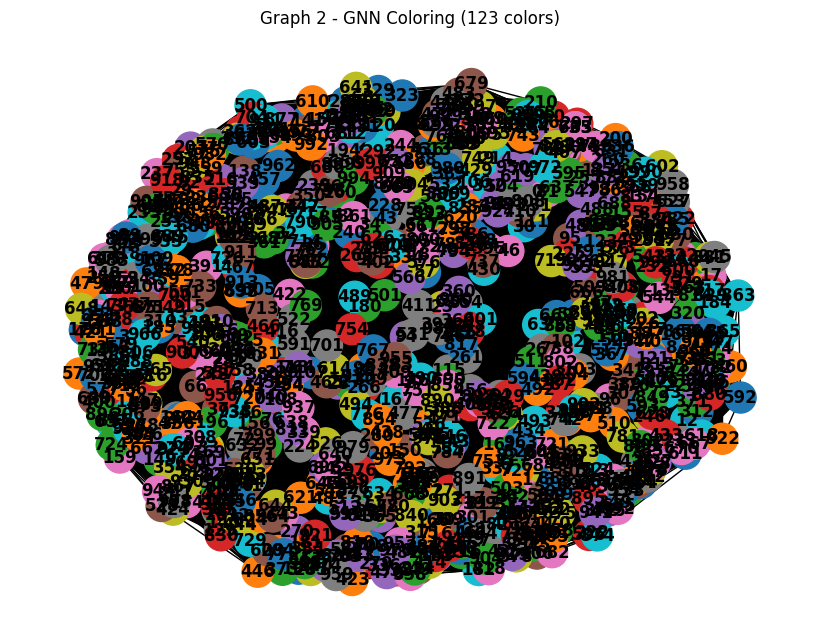


Training GNN for Graph 3
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.0867
Epoch 060, Loss: 0.0676
Epoch 040, Loss: 0.0867
Epoch 060, Loss: 0.0676
Epoch 080, Loss: 0.0619
Epoch 100, Loss: 0.0595
Epoch 080, Loss: 0.0619
Epoch 100, Loss: 0.0595
Epoch 120, Loss: 0.0639
Epoch 140, Loss: 0.0557
Epoch 120, Loss: 0.0639
Epoch 140, Loss: 0.0557
Epoch 160, Loss: 0.0529
Epoch 180, Loss: 0.0525
Epoch 160, Loss: 0.0529
Epoch 180, Loss: 0.0525
Epoch 200, Loss: 0.0559
GNN training execution time: 1.8973 seconds
Epoch 200, Loss: 0.0559
GNN training execution time: 1.8973 seconds


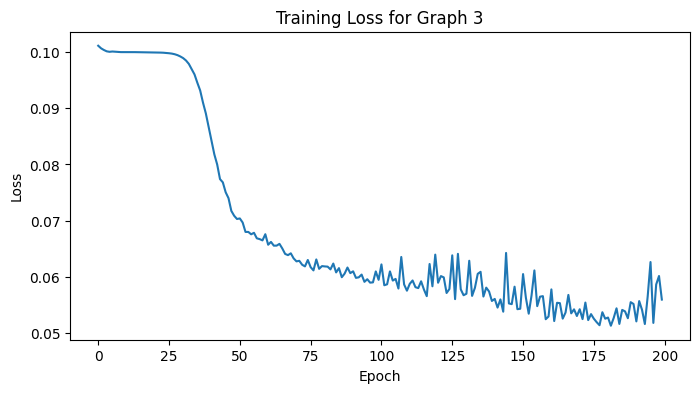

tensor([[ 12.1881,  12.2764,  10.9180,  ...,  12.0481,   1.0647, -13.4061],
        [ 10.9180,  10.9638,   9.8076,  ...,  10.7790,   1.0241, -12.0427],
        [ 12.7196,  12.8007,  11.4112,  ...,  12.5902,   1.1372, -14.0135],
        ...,
        [-16.8206, -17.0290, -13.2235,  ..., -16.2546,   3.5746,   7.2445],
        [ 11.2744,  11.2134,  10.7283,  ...,  11.3594,   2.3316, -15.0533],
        [-28.3505, -28.8076, -22.6792,  ..., -27.7600,   5.1060,  13.1693]])
[[2.3382047e-01 2.5540036e-01 6.5659769e-02 ... 2.0328124e-01
  3.4519283e-06 1.7925093e-12]
 [2.3801230e-01 2.4916109e-01 7.8404859e-02 ... 2.0711491e-01
  1.2014426e-05 2.5402852e-11]
 [2.3434919e-01 2.5416103e-01 6.3331060e-02 ... 2.0590578e-01
  2.1861676e-06 5.7519858e-13]
 ...
 [2.6472609e-11 2.1493774e-11 9.6602237e-10 ... 4.6622439e-11
  1.9068310e-02 7.4843228e-01]
 [2.1448161e-01 2.0179470e-01 1.2423570e-01 ... 2.3351714e-01
  2.8027825e-05 7.8966315e-13]
 [4.6646328e-19 2.9532134e-19 1.3546734e-16 ... 8.4188292e-1

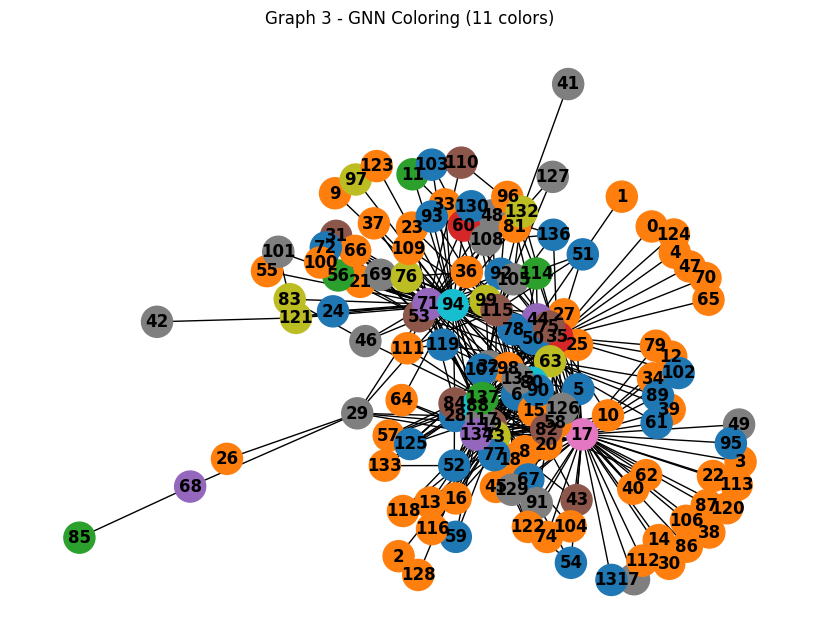


Training GNN for Graph 4
Epoch 020, Loss: 0.0253
Epoch 020, Loss: 0.0253
Epoch 040, Loss: 0.0058
Epoch 040, Loss: 0.0058
Epoch 060, Loss: 0.0003
Epoch 060, Loss: 0.0003
Epoch 080, Loss: 0.0000
Epoch 080, Loss: 0.0000
Epoch 100, Loss: 0.0000
Epoch 100, Loss: 0.0000
Epoch 120, Loss: 0.0000
Epoch 120, Loss: 0.0000
Epoch 140, Loss: 0.0000
Epoch 140, Loss: 0.0000
Epoch 160, Loss: 0.0000
Epoch 160, Loss: 0.0000
Epoch 180, Loss: 0.0000
Epoch 180, Loss: 0.0000
Epoch 200, Loss: 0.0000
GNN training execution time: 47.9247 seconds
Epoch 200, Loss: 0.0000
GNN training execution time: 47.9247 seconds


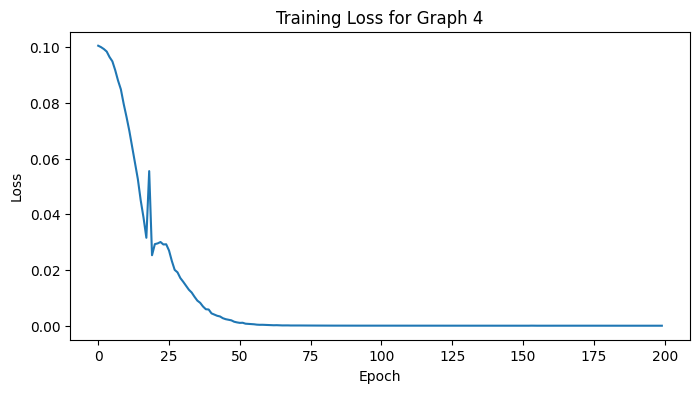

tensor([[-20.6363,  20.8395,  23.0977,  ..., -24.8548, -20.7324, -11.6536],
        [  2.4804,   4.8918,   3.2974,  ...,   2.0604,   2.1153,   4.0936],
        [  2.4833,   4.9048,   3.3075,  ...,   2.0617,   2.1167,   4.1005],
        ...,
        [  2.3477,   4.7541,   3.2244,  ...,   1.9426,   1.9770,   3.9277],
        [  2.3425,   4.7491,   3.2240,  ...,   1.9351,   1.9712,   3.9192],
        [  2.4821,   4.9091,   3.3114,  ...,   2.0603,   2.1142,   4.1004]])
[[6.4939191e-27 6.6870083e-09 6.3963398e-08 ... 9.5591258e-29
  5.8991057e-27 5.1718283e-23]
 [2.8246511e-03 3.1494107e-02 6.3940817e-03 ... 1.8560323e-03
  1.9606319e-03 1.4176803e-02]
 [2.7801176e-03 3.1311706e-02 6.3391966e-03 ... 1.8238343e-03
  1.9269593e-03 1.4008844e-02]
 ...
 [3.1718910e-03 3.5188861e-02 7.6216371e-03 ... 2.1152524e-03
  2.1893720e-03 1.5399331e-02]
 [3.1707278e-03 3.5181172e-02 7.6556630e-03 ... 2.1097744e-03
  2.1872744e-03 1.5343506e-02]
 [2.7625894e-03 3.1285930e-02 6.3311998e-03 ... 1.8118402e-0

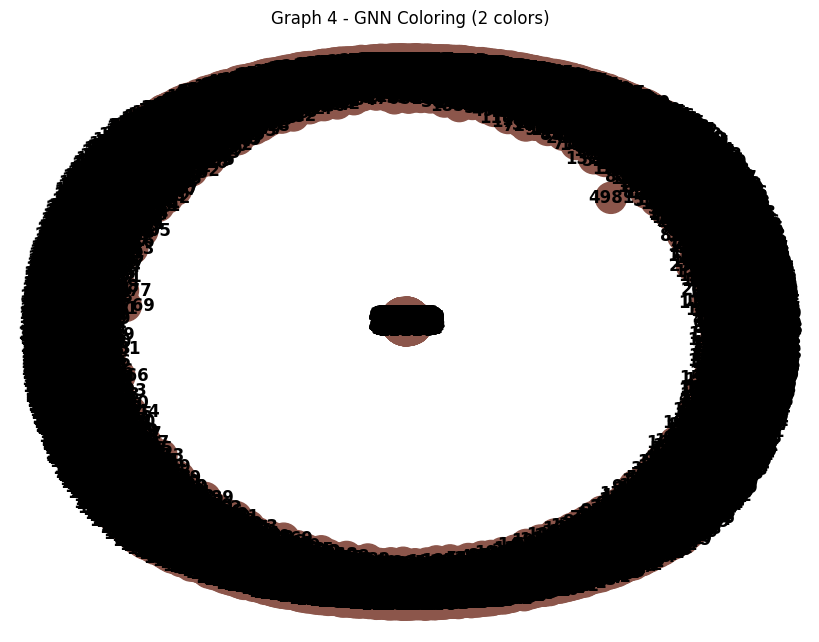


Training GNN for Graph 5
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.5516 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.5516 seconds


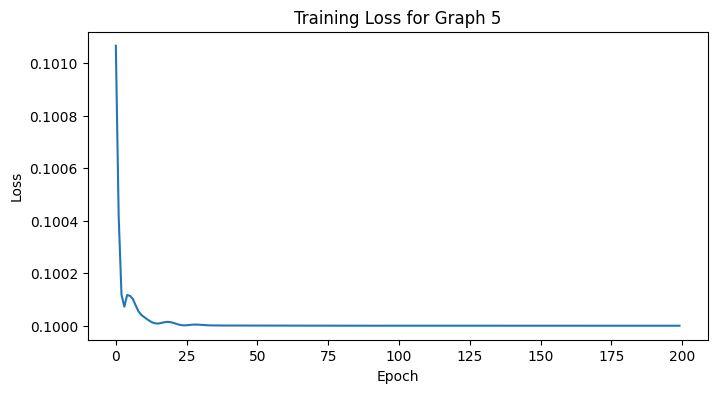

tensor([[0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0.0708, 0.0705, 0.0704, 0.0707, 0.0708, 0.0705, 0.0705, 0.0704, 0.0707,
         0.0705],
        [0

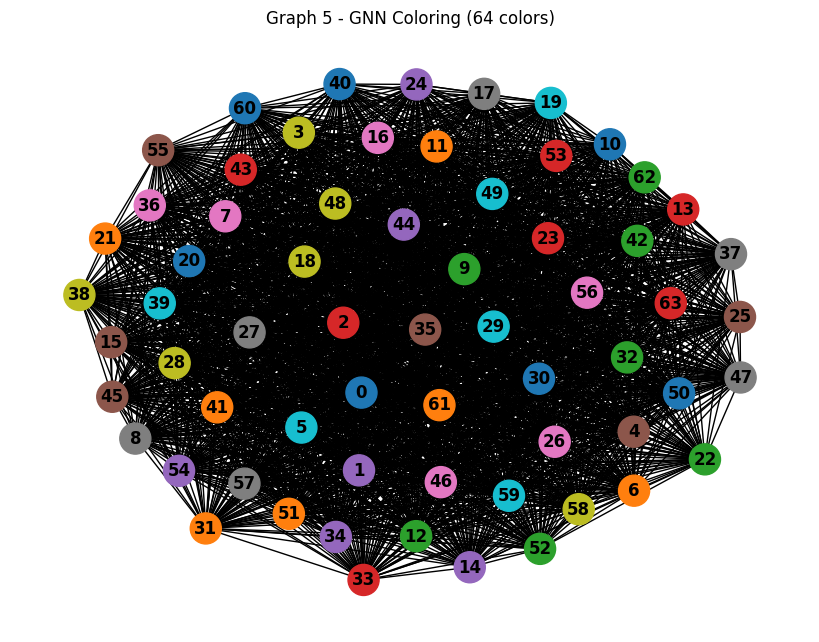


Training GNN for Graph 6
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000

Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.0835 seconds
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.0835 seconds


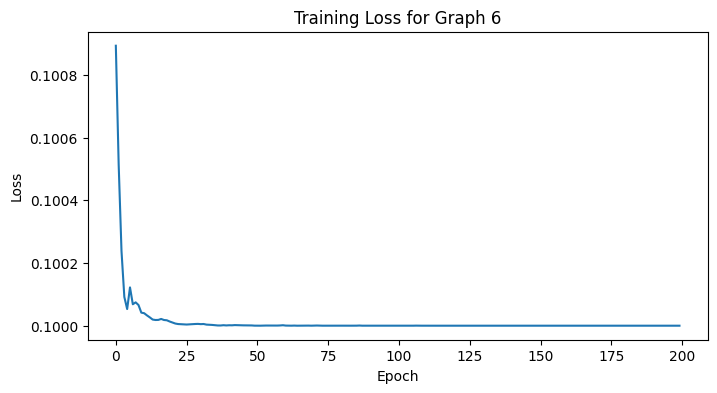

tensor([[0.0623, 0.0637, 0.0625, 0.0630, 0.0635, 0.0628, 0.0625, 0.0635, 0.0631,
         0.0637],
        [0.0625, 0.0637, 0.0627, 0.0630, 0.0635, 0.0628, 0.0624, 0.0636, 0.0631,
         0.0636],
        [0.0622, 0.0634, 0.0628, 0.0632, 0.0633, 0.0627, 0.0626, 0.0632, 0.0629,
         0.0638]])
[[0.09992325 0.10006326 0.09994926 0.09999245 0.10004211 0.09997233
  0.09993983 0.10004283 0.10000696 0.10006765]
 [0.0999442  0.10006257 0.09995539 0.09999081 0.10004306 0.09996995
  0.09993433 0.10005153 0.09999537 0.10005277]
 [0.09991709 0.10003647 0.09998295 0.10001359 0.10002928 0.09997094
  0.09995382 0.10002127 0.09999197 0.10008263]]
GNN coloring for Graph 6 uses 2 colors
Color assignments: [9, 1, 1]


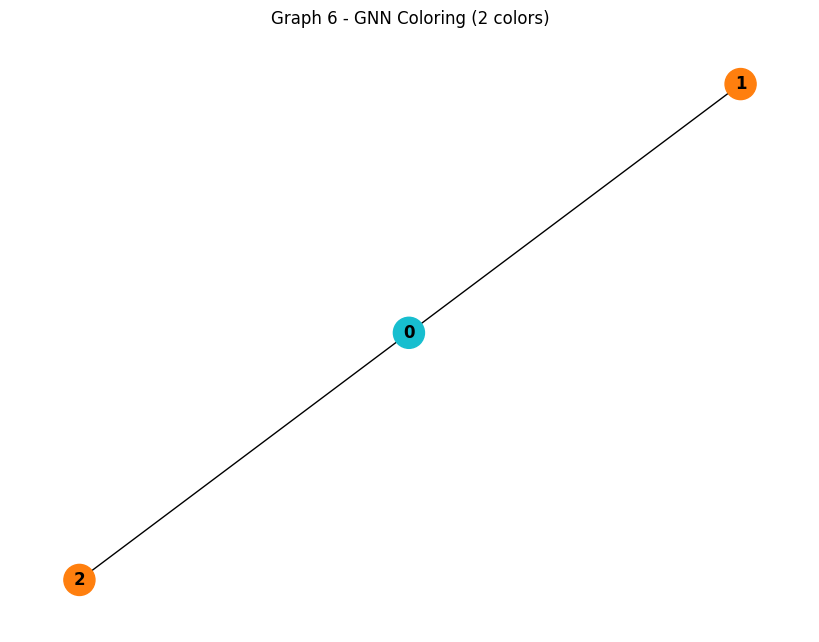


Training GNN for Graph 7
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 7.7271 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 7.7271 seconds


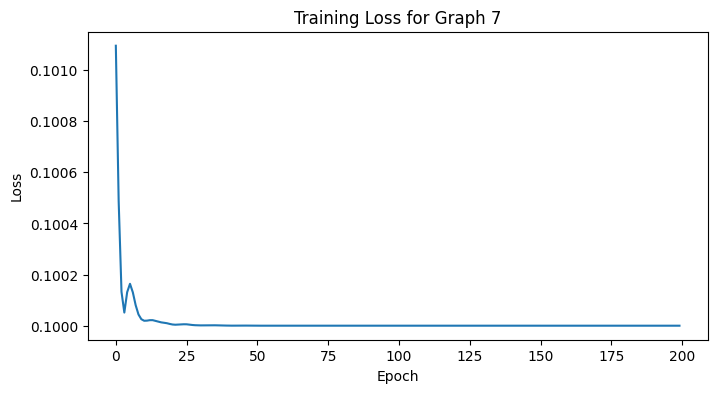

tensor([[0.0313, 0.0333, 0.0325,  ..., 0.0325, 0.0324, 0.0326],
        [0.0313, 0.0332, 0.0325,  ..., 0.0325, 0.0325, 0.0326],
        [0.0314, 0.0332, 0.0324,  ..., 0.0325, 0.0326, 0.0326],
        ...,
        [0.0315, 0.0332, 0.0323,  ..., 0.0326, 0.0327, 0.0327],
        [0.0316, 0.0332, 0.0322,  ..., 0.0328, 0.0329, 0.0327],
        [0.0315, 0.0332, 0.0323,  ..., 0.0327, 0.0327, 0.0327]])
[[0.09987727 0.100077   0.1000054  ... 0.09999711 0.0999951  0.10000926]
 [0.09987976 0.10007687 0.1000032  ... 0.09999914 0.09999817 0.1000105 ]
 [0.09988869 0.10007636 0.09999558 ... 0.1000064  0.10000859 0.10001462]
 ...
 [0.0999021  0.10007562 0.09998425 ... 0.10001715 0.10002389 0.10002058]
 [0.09991782 0.10007474 0.09997086 ... 0.10002985 0.10004199 0.10002767]
 [0.09990404 0.10007552 0.09998253 ... 0.10001875 0.10002632 0.10002158]]
GNN coloring for Graph 7 uses 71 colors
Color assignments: [3, 18, 16, 5, 17, 11, 41, 55, 8, 36, 49, 27, 32, 3, 12, 20, 44, 44, 49, 47, 26, 39, 53, 28, 48, 21

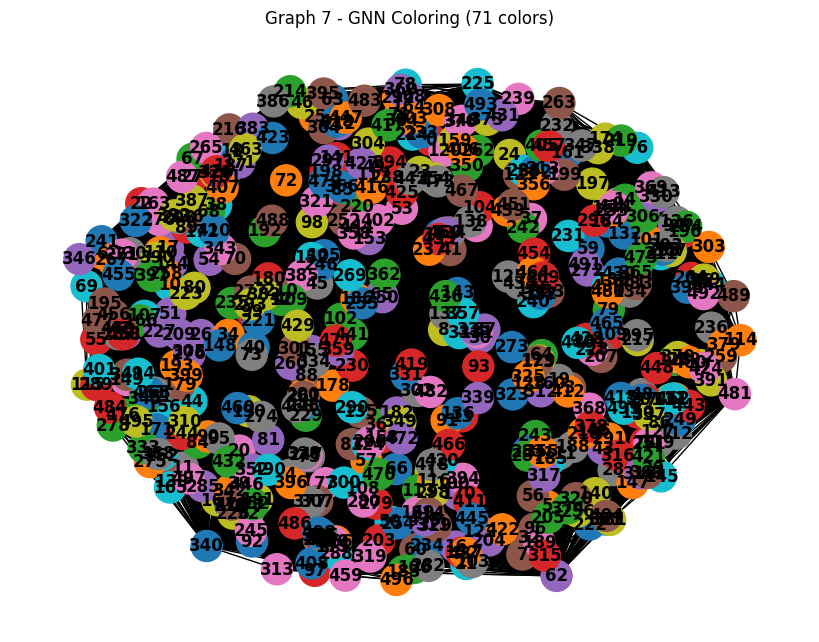


Training GNN for Graph 8
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1531 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1531 seconds


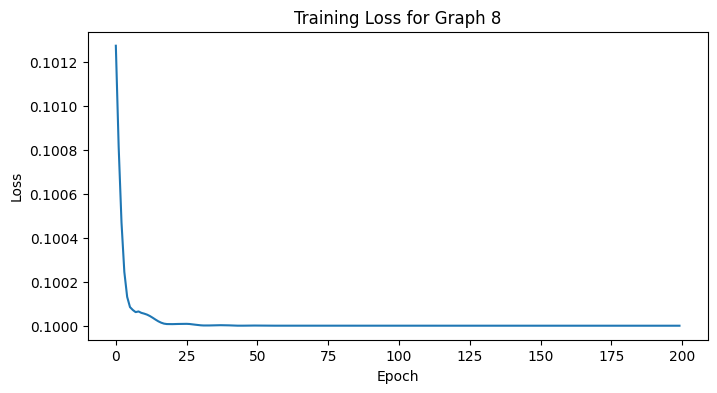

tensor([[-0.0059, -0.0064, -0.0059, -0.0060, -0.0060, -0.0063, -0.0056, -0.0064,
         -0.0058, -0.0056],
        [-0.0061, -0.0063, -0.0060, -0.0060, -0.0060, -0.0063, -0.0057, -0.0064,
         -0.0059, -0.0057],
        [-0.0062, -0.0063, -0.0060, -0.0060, -0.0059, -0.0063, -0.0058, -0.0063,
         -0.0059, -0.0057],
        [-0.0061, -0.0063, -0.0061, -0.0060, -0.0060, -0.0062, -0.0058, -0.0065,
         -0.0059, -0.0056],
        [-0.0062, -0.0062, -0.0061, -0.0060, -0.0060, -0.0063, -0.0058, -0.0064,
         -0.0060, -0.0057],
        [-0.0059, -0.0064, -0.0059, -0.0060, -0.0060, -0.0063, -0.0056, -0.0064,
         -0.0058, -0.0056],
        [-0.0061, -0.0063, -0.0060, -0.0060, -0.0060, -0.0063, -0.0057, -0.0064,
         -0.0059, -0.0057],
        [-0.0061, -0.0063, -0.0060, -0.0060, -0.0059, -0.0063, -0.0057, -0.0063,
         -0.0058, -0.0057],
        [-0.0061, -0.0063, -0.0061, -0.0060, -0.0060, -0.0062, -0.0058, -0.0064,
         -0.0059, -0.0057],
        [-0.0062, -

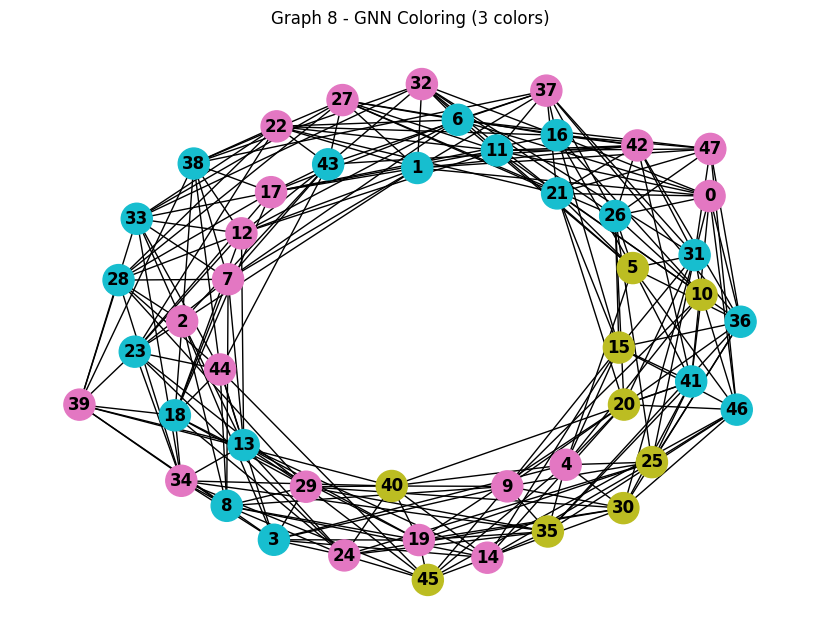


Training GNN for Graph 9
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1280 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1280 seconds


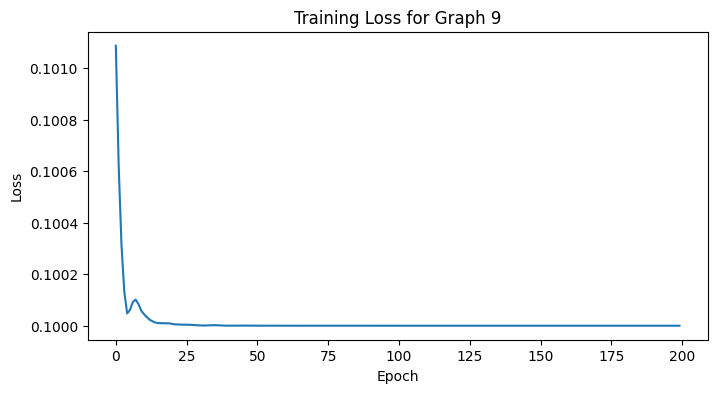

tensor([[-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -0.0183, -0.0182, -0.0184, -0.0184, -0.0190, -0.0183, -0.0183,
         -0.0185, -0.0182],
        [-0.0182, -

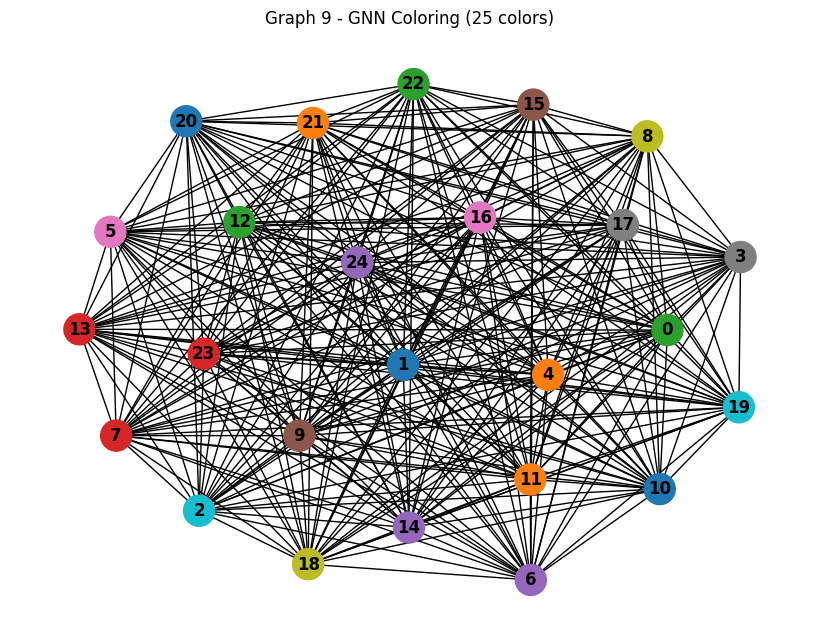


Training GNN for Graph 10
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1955 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1955 seconds


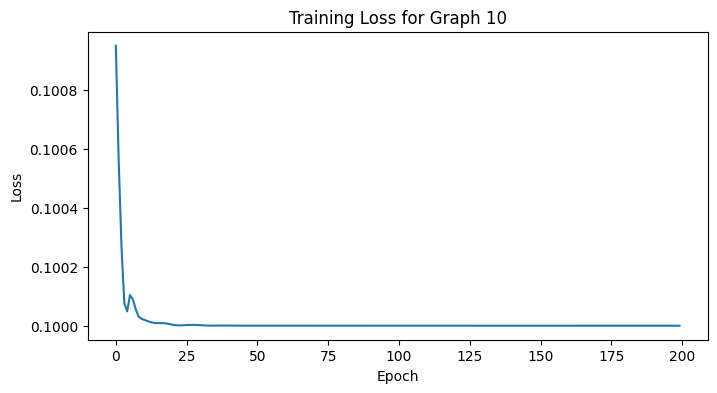

tensor([[0.0430, 0.0429, 0.0433, 0.0432, 0.0434, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0.0430, 0.0430, 0.0433, 0.0432, 0.0433, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0.0430, 0.0430, 0.0433, 0.0432, 0.0433, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0.0430, 0.0429, 0.0433, 0.0432, 0.0434, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0.0430, 0.0429, 0.0433, 0.0432, 0.0433, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0.0430, 0.0430, 0.0433, 0.0432, 0.0433, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0.0431, 0.0430, 0.0433, 0.0433, 0.0432, 0.0434, 0.0432, 0.0433, 0.0435,
         0.0434],
        [0.0431, 0.0430, 0.0433, 0.0433, 0.0432, 0.0434, 0.0432, 0.0433, 0.0435,
         0.0434],
        [0.0431, 0.0430, 0.0433, 0.0433, 0.0432, 0.0434, 0.0432, 0.0433, 0.0435,
         0.0435],
        [0.0429, 0.0430, 0.0433, 0.0432, 0.0433, 0.0434, 0.0433, 0.0432, 0.0436,
         0.0433],
        [0

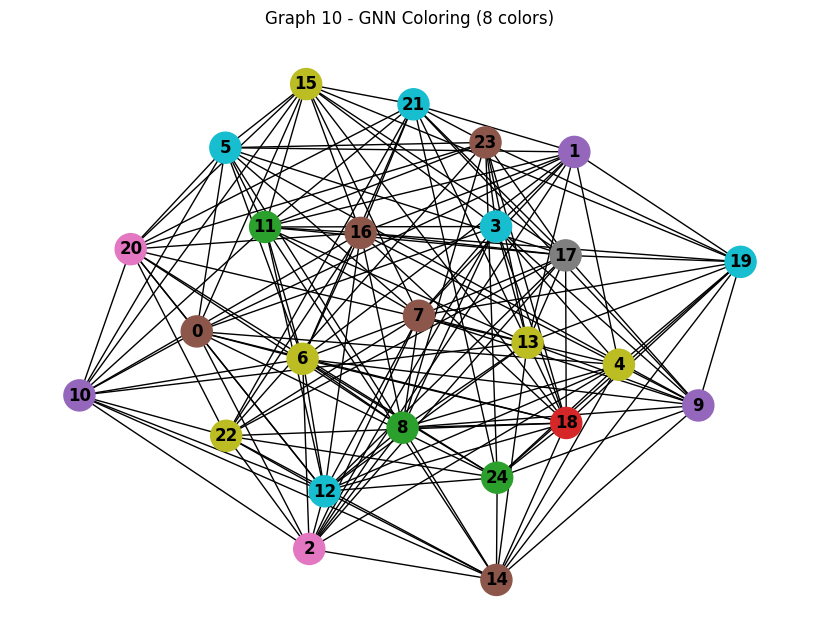


Training GNN for Graph 11
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000

Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.0907 seconds
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.0907 seconds


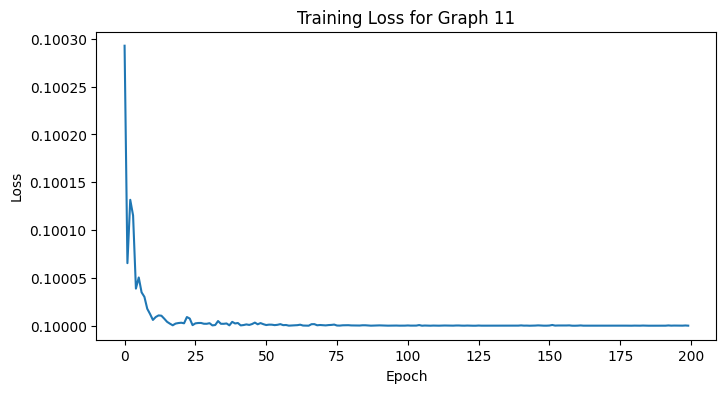

tensor([[-0.0371, -0.0380, -0.0367, -0.0377, -0.0379, -0.0358, -0.0358, -0.0370,
         -0.0366, -0.0365],
        [-0.0368, -0.0368, -0.0370, -0.0384, -0.0370, -0.0365, -0.0367, -0.0368,
         -0.0365, -0.0368],
        [-0.0365, -0.0372, -0.0369, -0.0379, -0.0368, -0.0363, -0.0366, -0.0366,
         -0.0362, -0.0366]])
[[0.09998249 0.09989479 0.10002278 0.09991908 0.09989648 0.10010759
  0.10010895 0.09998725 0.10003588 0.10004472]
 [0.10001412 0.10001176 0.09998888 0.0998552  0.09999474 0.10004693
  0.1000273  0.10000968 0.10004106 0.10001026]
 [0.10002382 0.09995247 0.09999    0.0998873  0.09999963 0.10004223
  0.10001436 0.1000175  0.10005366 0.10001899]]
GNN coloring for Graph 11 uses 3 colors
Color assignments: [6, 5, 8]


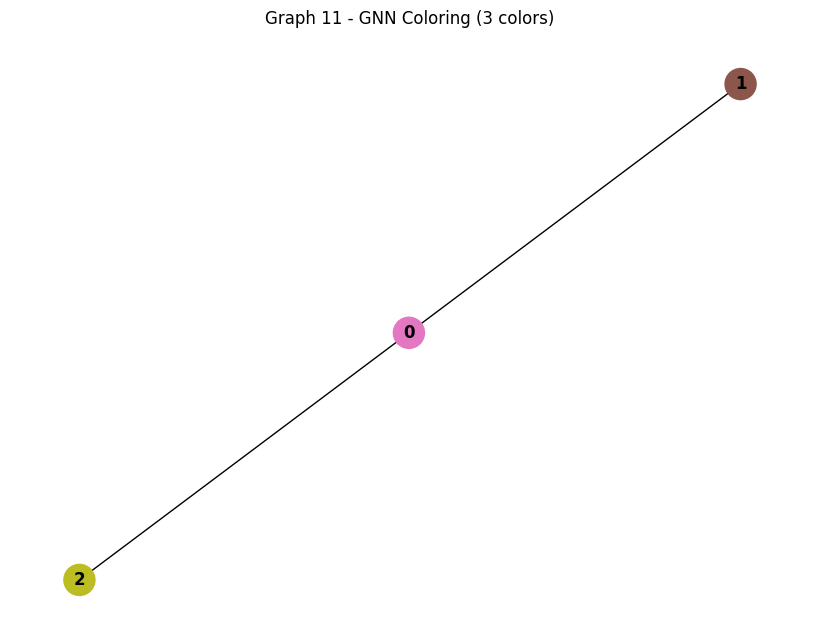


Training GNN for Graph 12
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1667 seconds
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1667 seconds


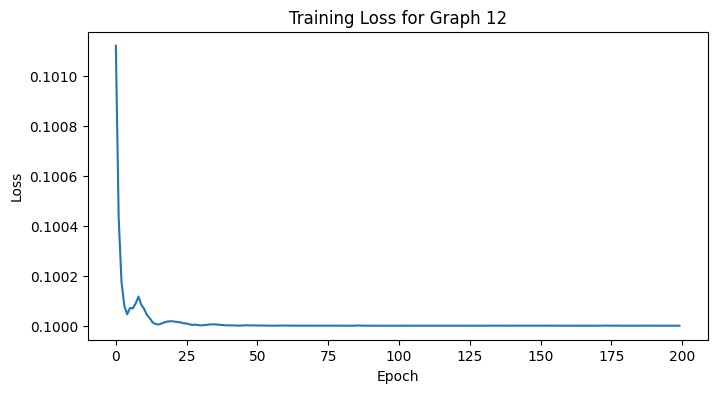

tensor([[0.0040, 0.0033, 0.0041, 0.0034, 0.0041, 0.0028, 0.0041, 0.0041, 0.0041,
         0.0035],
        [0.0042, 0.0034, 0.0049, 0.0030, 0.0043, 0.0026, 0.0044, 0.0043, 0.0042,
         0.0033],
        [0.0041, 0.0032, 0.0049, 0.0029, 0.0044, 0.0025, 0.0046, 0.0044, 0.0043,
         0.0031]])
[[0.10001978 0.09995538 0.10003942 0.09996337 0.10003809 0.09990099
  0.10003826 0.10003478 0.10003591 0.09997413]
 [0.10003351 0.0999516  0.10010627 0.09991366 0.1000409  0.09987659
  0.10005929 0.10004371 0.10003188 0.09994257]
 [0.10003101 0.09993549 0.10010944 0.09990572 0.10005462 0.09986511
  0.10007235 0.10005189 0.10004874 0.09992553]]
GNN coloring for Graph 12 uses 2 colors
Color assignments: [2, 6, 6]


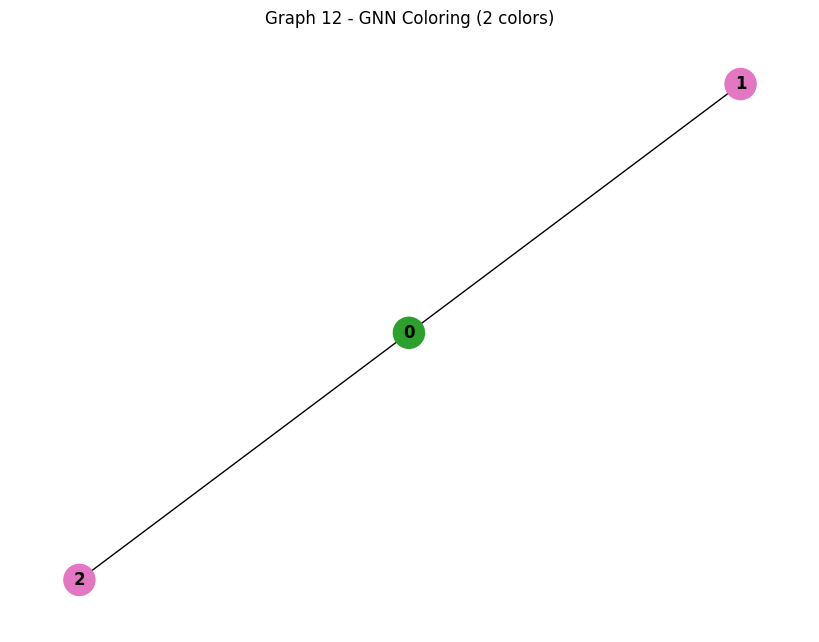


Training GNN for Graph 13
Epoch 020, Loss: 0.0921
Epoch 020, Loss: 0.0921
Epoch 040, Loss: 0.0392
Epoch 060, Loss: 0.0088
Epoch 040, Loss: 0.0392
Epoch 060, Loss: 0.0088
Epoch 080, Loss: 0.0093
Epoch 100, Loss: 0.0083
Epoch 080, Loss: 0.0093
Epoch 100, Loss: 0.0083
Epoch 120, Loss: 0.0078
Epoch 140, Loss: 0.0077
Epoch 120, Loss: 0.0078
Epoch 140, Loss: 0.0077
Epoch 160, Loss: 0.0078
Epoch 180, Loss: 0.0078
Epoch 160, Loss: 0.0078
Epoch 180, Loss: 0.0078
Epoch 200, Loss: 0.0077
GNN training execution time: 1.8950 seconds
Epoch 200, Loss: 0.0077
GNN training execution time: 1.8950 seconds


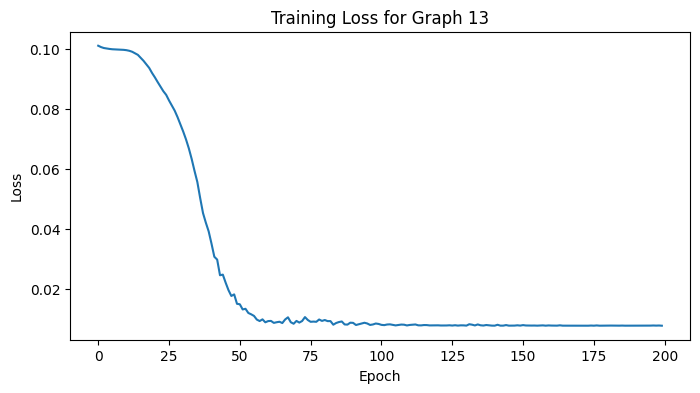

tensor([[  0.8949,   0.8017,   0.9398,  ..., -13.3217,   0.8798, -11.2949],
        [  0.8949,   0.8017,   0.9398,  ..., -13.3217,   0.8798, -11.2949],
        [  0.8949,   0.8017,   0.9398,  ..., -13.3217,   0.8798, -11.2949],
        ...,
        [ -4.2045,  -2.6555,  -3.6752,  ...,   7.4570,  -4.2541,   6.4871],
        [ -4.2046,  -2.6556,  -3.6753,  ...,   7.4571,  -4.2542,   6.4873],
        [ -4.2044,  -2.6555,  -3.6751,  ...,   7.4568,  -4.2540,   6.4870]])
[[2.0589632e-01 1.8758108e-01 2.1534592e-01 ... 1.3786789e-07
  2.0281209e-01 1.0463594e-06]
 [2.0589632e-01 1.8758108e-01 2.1534592e-01 ... 1.3786789e-07
  2.0281209e-01 1.0463594e-06]
 [2.0589632e-01 1.8758108e-01 2.1534592e-01 ... 1.3786789e-07
  2.0281209e-01 1.0463594e-06]
 ...
 [4.0550317e-06 1.9085770e-05 6.8846120e-06 ... 4.7044560e-01
  3.8587441e-06 1.7836639e-01]
 [4.0539935e-06 1.9081792e-05 6.8830850e-06 ... 4.7044894e-01
  3.8577778e-06 1.7836569e-01]
 [4.0561522e-06 1.9090134e-05 6.8863105e-06 ... 4.7044140e-0

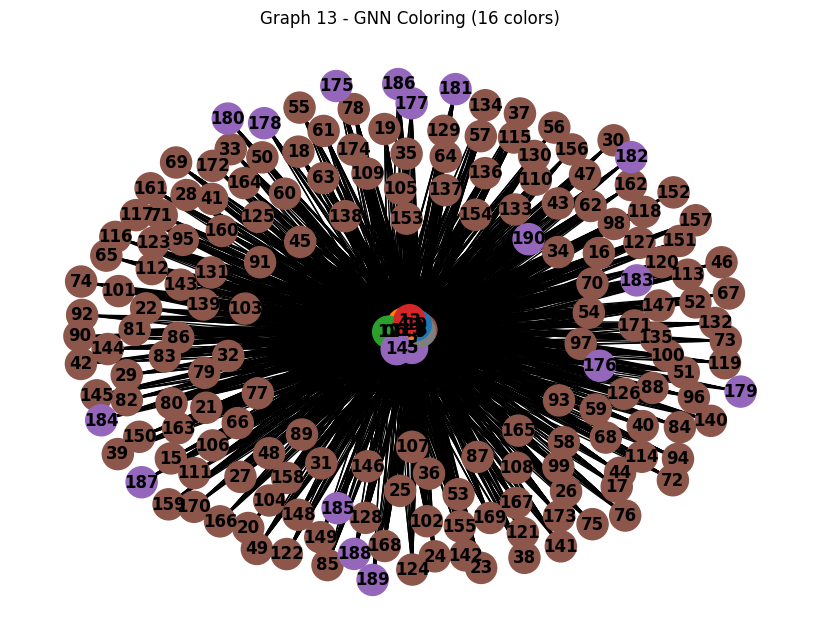


Training GNN for Graph 14
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.6891 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.6891 seconds


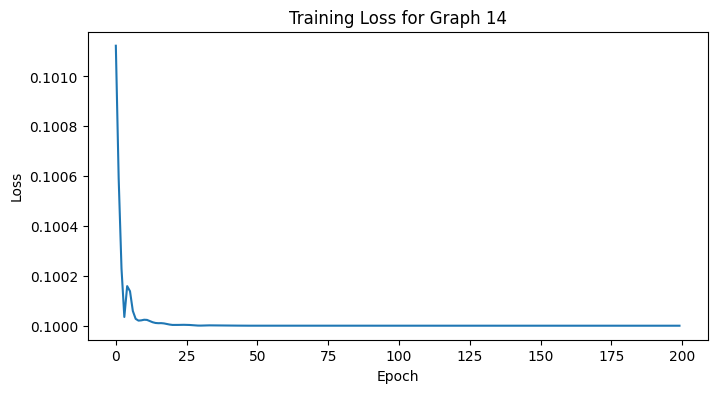

tensor([[0.0295, 0.0291, 0.0297, 0.0288, 0.0294, 0.0300, 0.0296, 0.0293, 0.0299,
         0.0297],
        [0.0295, 0.0291, 0.0298, 0.0288, 0.0294, 0.0300, 0.0296, 0.0293, 0.0298,
         0.0296],
        [0.0293, 0.0286, 0.0300, 0.0286, 0.0299, 0.0301, 0.0299, 0.0291, 0.0298,
         0.0291],
        [0.0295, 0.0289, 0.0298, 0.0287, 0.0296, 0.0300, 0.0297, 0.0293, 0.0298,
         0.0295],
        [0.0295, 0.0291, 0.0297, 0.0288, 0.0294, 0.0299, 0.0296, 0.0293, 0.0298,
         0.0296],
        [0.0295, 0.0290, 0.0298, 0.0288, 0.0295, 0.0300, 0.0297, 0.0293, 0.0298,
         0.0296],
        [0.0292, 0.0285, 0.0301, 0.0286, 0.0300, 0.0302, 0.0299, 0.0291, 0.0298,
         0.0289],
        [0.0295, 0.0290, 0.0298, 0.0288, 0.0294, 0.0300, 0.0296, 0.0293, 0.0298,
         0.0296],
        [0.0295, 0.0290, 0.0298, 0.0288, 0.0295, 0.0300, 0.0297, 0.0293, 0.0298,
         0.0295],
        [0.0295, 0.0290, 0.0298, 0.0288, 0.0295, 0.0300, 0.0297, 0.0293, 0.0298,
         0.0295],
        [0

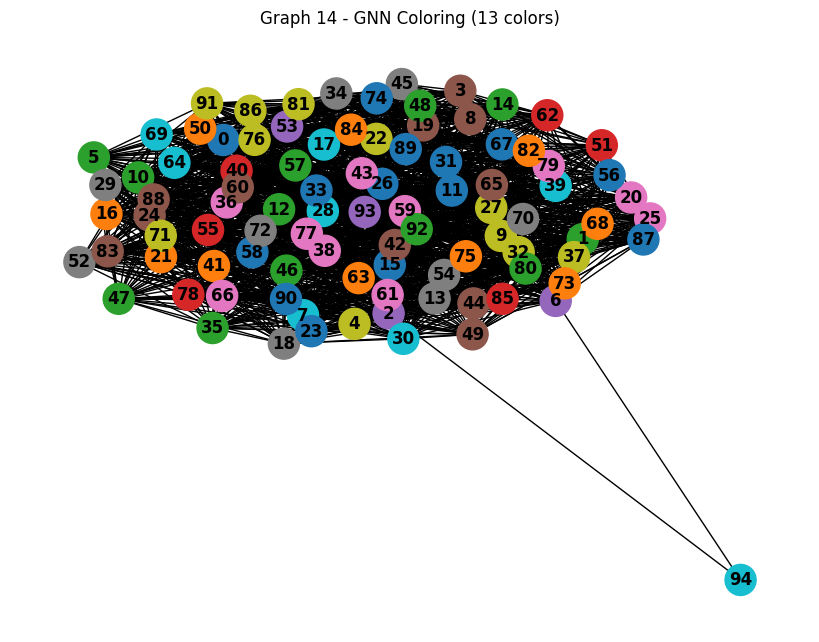


Training GNN for Graph 15
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.4792 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.4792 seconds


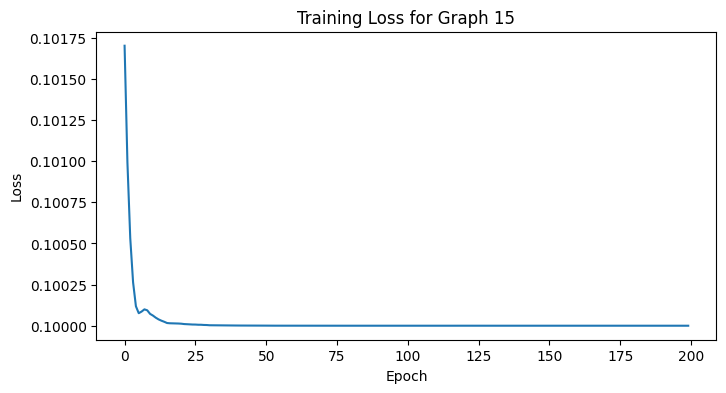

tensor([[0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0.0299, 0.0294, 0.0298, 0.0297, 0.0304, 0.0302, 0.0303, 0.0290, 0.0291,
         0.0303],
        [0

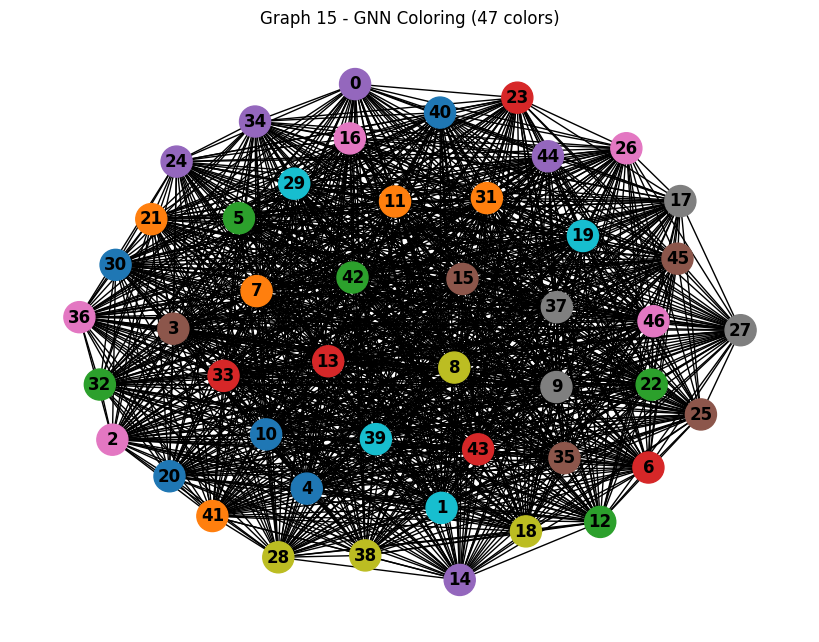


Training GNN for Graph 16
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.6093 seconds
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.6093 seconds


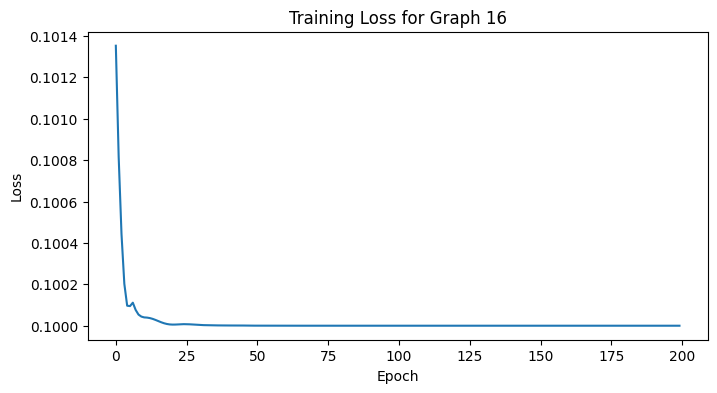

tensor([[-0.0239, -0.0241, -0.0241, -0.0239, -0.0234, -0.0239, -0.0235, -0.0238,
         -0.0237, -0.0237],
        [-0.0239, -0.0243, -0.0241, -0.0240, -0.0233, -0.0238, -0.0232, -0.0237,
         -0.0236, -0.0236],
        [-0.0239, -0.0240, -0.0239, -0.0237, -0.0234, -0.0236, -0.0234, -0.0239,
         -0.0238, -0.0234],
        [-0.0240, -0.0242, -0.0239, -0.0237, -0.0233, -0.0236, -0.0232, -0.0239,
         -0.0237, -0.0233],
        [-0.0239, -0.0240, -0.0239, -0.0237, -0.0235, -0.0236, -0.0234, -0.0239,
         -0.0238, -0.0235],
        [-0.0240, -0.0243, -0.0240, -0.0238, -0.0233, -0.0237, -0.0231, -0.0239,
         -0.0237, -0.0234],
        [-0.0240, -0.0242, -0.0239, -0.0237, -0.0233, -0.0236, -0.0233, -0.0239,
         -0.0237, -0.0233],
        [-0.0239, -0.0245, -0.0239, -0.0241, -0.0233, -0.0239, -0.0230, -0.0238,
         -0.0234, -0.0234],
        [-0.0239, -0.0240, -0.0238, -0.0237, -0.0234, -0.0236, -0.0234, -0.0239,
         -0.0238, -0.0234],
        [-0.0239, -

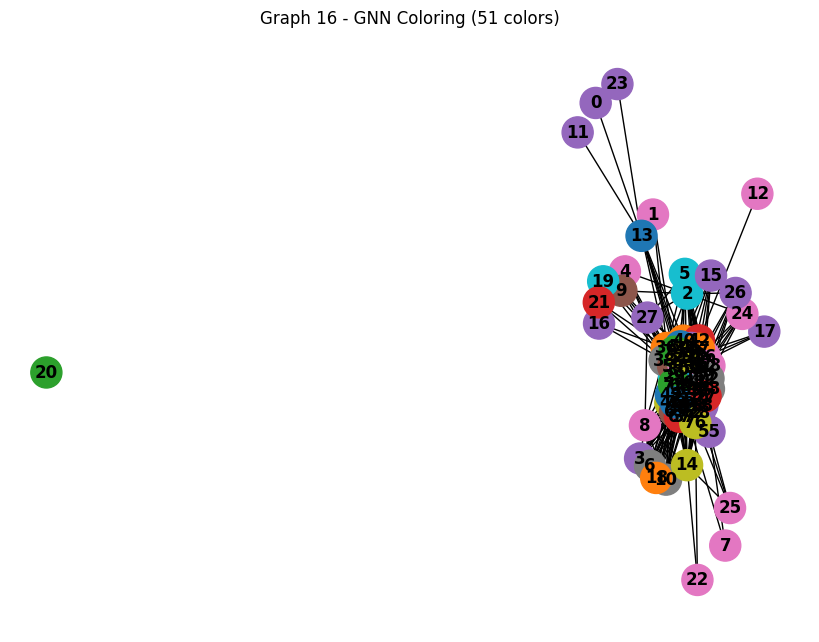


Training GNN for Graph 17
Epoch 020, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.7870 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.7870 seconds


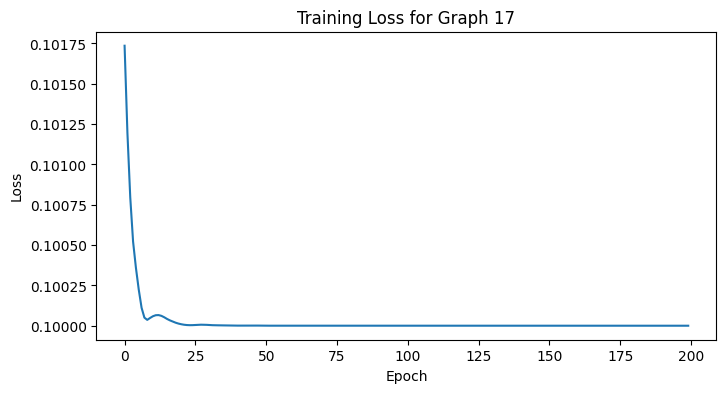

tensor([[-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -0.0086, -0.0084, -0.0084, -0.0086, -0.0085, -0.0085, -0.0084,
         -0.0084, -0.0086],
        [-0.0085, -

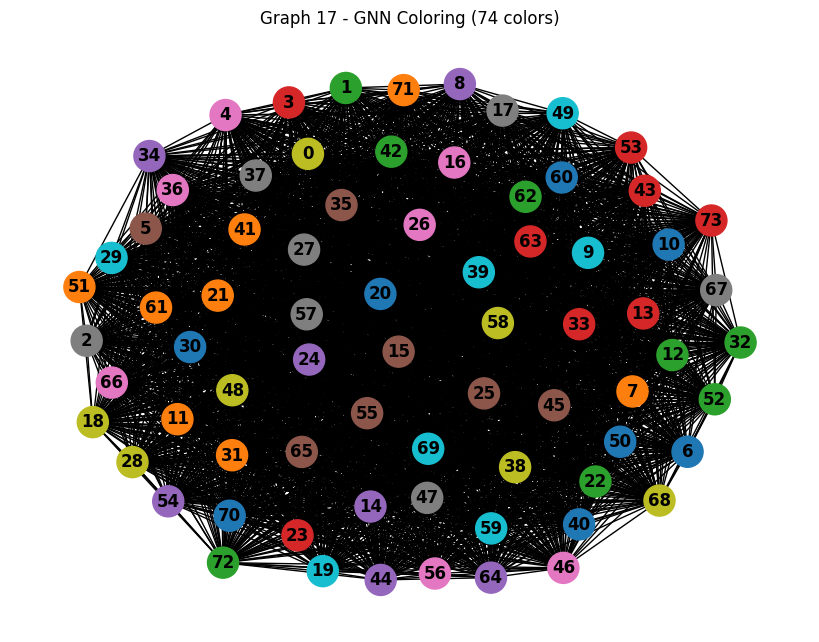


Training GNN for Graph 18
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.2497 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.2497 seconds


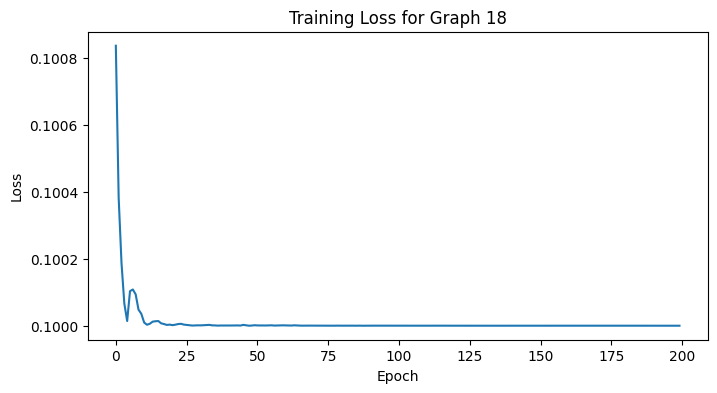

tensor([[0.0201, 0.0191, 0.0195, 0.0194, 0.0198, 0.0198, 0.0195, 0.0196, 0.0191,
         0.0194],
        [0.0203, 0.0190, 0.0193, 0.0191, 0.0195, 0.0197, 0.0198, 0.0196, 0.0194,
         0.0196],
        [0.0202, 0.0194, 0.0193, 0.0191, 0.0191, 0.0199, 0.0198, 0.0198, 0.0195,
         0.0202]])
[[0.10005637 0.09995841 0.09999961 0.0999822  0.10002261 0.10002876
  0.10000055 0.10000445 0.09996085 0.09998617]
 [0.10007372 0.09994659 0.09997254 0.09995261 0.10000134 0.10001393
  0.1000301  0.10000811 0.09998988 0.1000112 ]
 [0.10005582 0.09997765 0.0999642  0.09994329 0.09994494 0.10002851
  0.1000219  0.10001604 0.09999168 0.10005593]]
GNN coloring for Graph 18 uses 3 colors
Color assignments: [0, 6, 9]


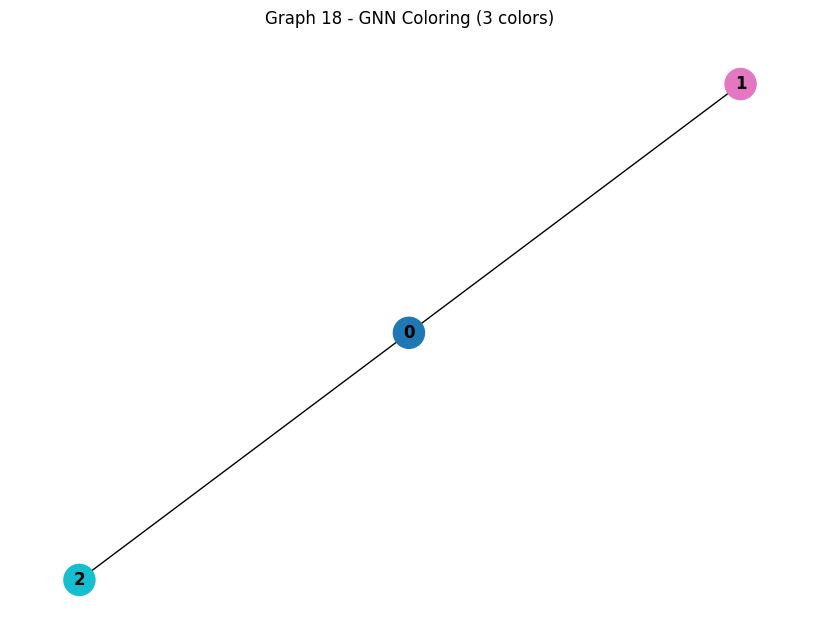


Training GNN for Graph 19
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.2883 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.2883 seconds


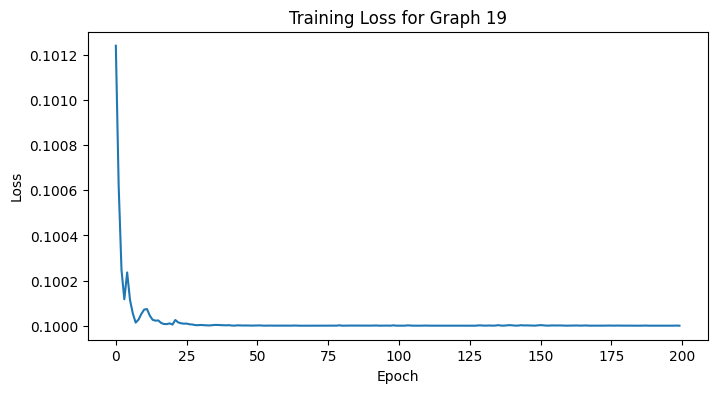

tensor([[0.0056, 0.0062, 0.0089, 0.0084, 0.0072, 0.0049, 0.0088, 0.0092, 0.0071,
         0.0085],
        [0.0053, 0.0062, 0.0093, 0.0090, 0.0068, 0.0042, 0.0097, 0.0100, 0.0065,
         0.0092],
        [0.0039, 0.0063, 0.0088, 0.0092, 0.0072, 0.0048, 0.0102, 0.0105, 0.0061,
         0.0097]])
[[0.09981601 0.09987579 0.10014742 0.10009325 0.09996954 0.09974067
  0.10013206 0.10016889 0.09995858 0.10009777]
 [0.09976795 0.09985721 0.10017007 0.10013745 0.09991695 0.09965841
  0.10020404 0.10024206 0.09988599 0.10015985]
 [0.09962407 0.09986084 0.10011548 0.10015135 0.09995525 0.0997103
  0.10025636 0.10028587 0.09984121 0.10019926]]
GNN coloring for Graph 19 uses 2 colors
Color assignments: [7, 6, 6]


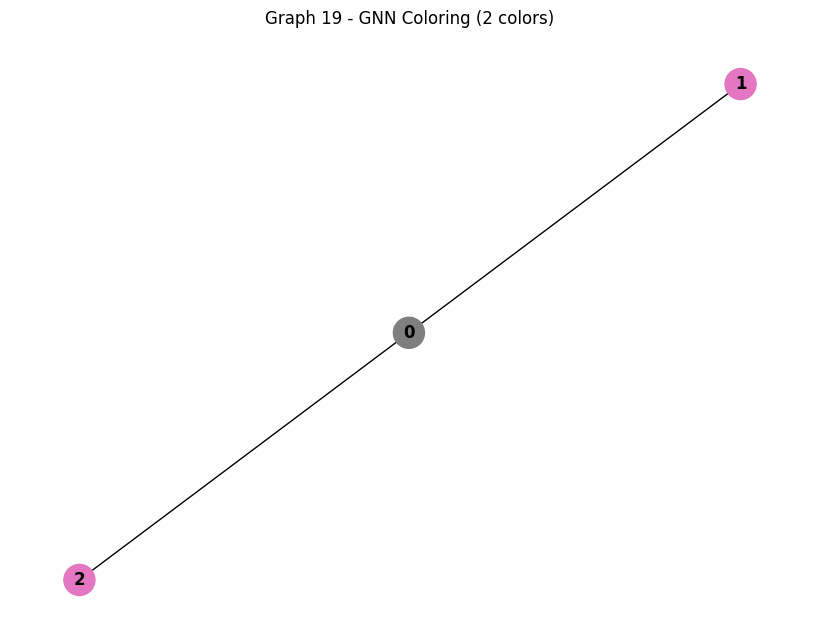


Training GNN for Graph 20
Epoch 020, Loss: 0.0422
Epoch 040, Loss: 0.0040
Epoch 060, Loss: 0.0014
Epoch 020, Loss: 0.0422
Epoch 040, Loss: 0.0040
Epoch 060, Loss: 0.0014
Epoch 080, Loss: 0.0004
Epoch 080, Loss: 0.0004
Epoch 100, Loss: 0.0003
Epoch 100, Loss: 0.0003
Epoch 120, Loss: 0.0002
Epoch 120, Loss: 0.0002
Epoch 140, Loss: 0.0002
Epoch 160, Loss: 0.0001
Epoch 140, Loss: 0.0002
Epoch 160, Loss: 0.0001
Epoch 180, Loss: 0.0000
Epoch 180, Loss: 0.0000
Epoch 200, Loss: 0.0000
GNN training execution time: 2.4038 seconds
Epoch 200, Loss: 0.0000
GNN training execution time: 2.4038 seconds


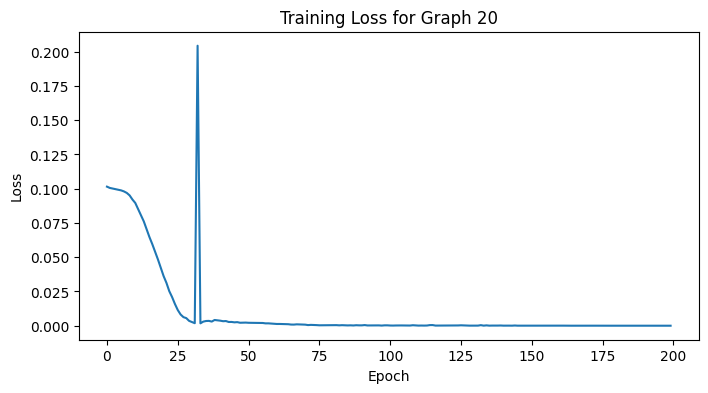

tensor([[ -0.6223,  -2.7423,  -5.2725,  ...,  -0.7933,   6.3960,   1.7856],
        [ -2.4839,  -6.8463, -10.4774,  ...,  -2.5790,  13.3691,   3.5948],
        [-13.7638, -35.1076, -58.4017,  ..., -14.8570,  71.8169,  20.1171],
        ...,
        [  6.2725,  10.1517,   4.5457,  ...,   6.0655,  -8.1067,  -1.4300],
        [  6.3501,  10.2823,   4.6044,  ...,   6.1414,  -8.2094,  -1.4468],
        [  6.3996,  10.3657,   4.6391,  ...,   6.1890,  -8.2761,  -1.4594]])
[[8.79169151e-04 1.05528525e-04 8.40481698e-06 ... 7.40995107e-04
  9.81957316e-01 9.76860244e-03]
 [1.30336687e-07 1.66159841e-09 4.40107430e-11 ... 1.18520440e-07
  9.99939680e-01 5.68904652e-05]
 [6.80418182e-38 0.00000000e+00 0.00000000e+00 ... 2.28038526e-38
  1.00000000e+00 3.52421779e-23]
 ...
 [1.95137113e-02 9.44123268e-01 3.47065250e-03 ... 1.58646777e-02
  1.11055769e-08 8.81403321e-06]
 [1.85641423e-02 9.47160900e-01 3.23995086e-03 ... 1.50687313e-02
  8.82258266e-09 7.63069147e-06]
 [1.79801919e-02 9.49041903e-0

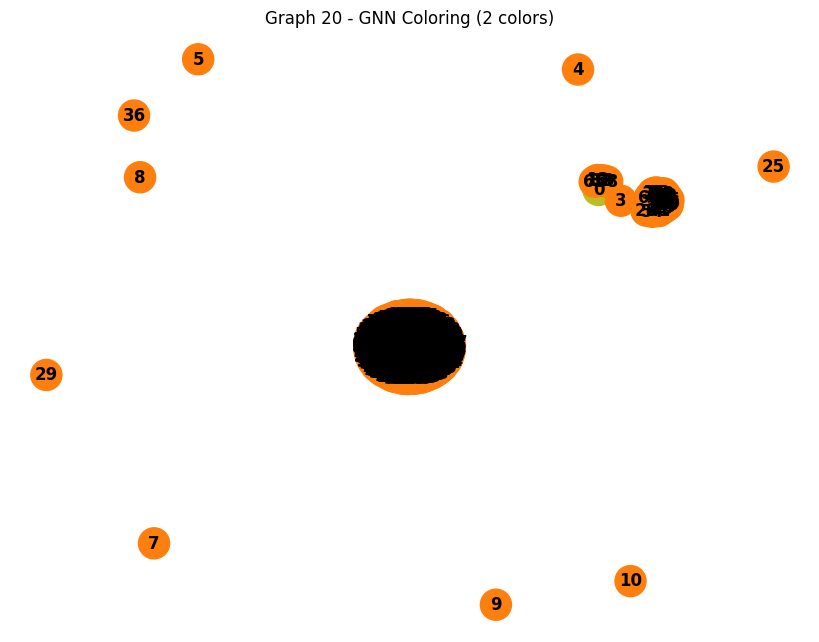


Training GNN for Graph 21
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1568 seconds
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.1568 seconds


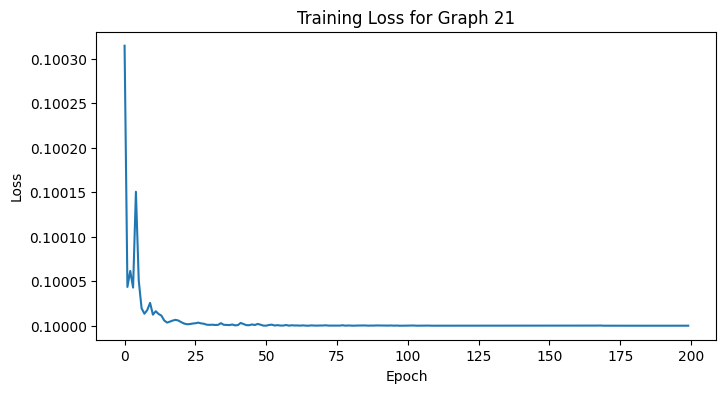

tensor([[0.0849, 0.0854, 0.0857, 0.0855, 0.0844, 0.0858, 0.0853, 0.0839, 0.0854,
         0.0853],
        [0.0849, 0.0859, 0.0858, 0.0857, 0.0840, 0.0862, 0.0853, 0.0840, 0.0855,
         0.0851],
        [0.0850, 0.0855, 0.0854, 0.0853, 0.0845, 0.0856, 0.0852, 0.0842, 0.0853,
         0.0853]])
[[0.09997434 0.10002273 0.10005519 0.10003121 0.09992813 0.10006121
  0.10001138 0.09987457 0.10002656 0.10001474]
 [0.09996762 0.1000616  0.1000549  0.10005093 0.09987517 0.10009154
  0.10000584 0.09987506 0.10002991 0.09998744]
 [0.09998585 0.10003471 0.10002791 0.10001708 0.09993638 0.10004785
  0.10000494 0.09990564 0.10001931 0.10002029]]
GNN coloring for Graph 21 uses 2 colors
Color assignments: [5, 1, 1]


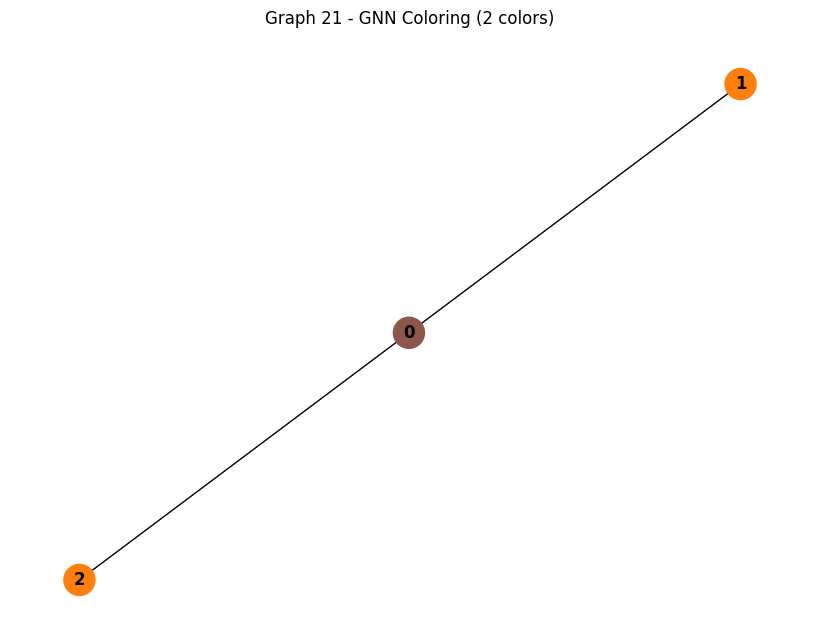


Training GNN for Graph 22
Epoch 020, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 040, Loss: 0.1000
Epoch 060, Loss: 0.1000
Epoch 080, Loss: 0.1000
Epoch 100, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 120, Loss: 0.1000
Epoch 140, Loss: 0.1000
Epoch 160, Loss: 0.1000
Epoch 180, Loss: 0.1000
Epoch 200, Loss: 0.1000
GNN training execution time: 1.3754 seconds
Epoch 200, Loss: 0.1000
GNN training execution time: 1.3754 seconds


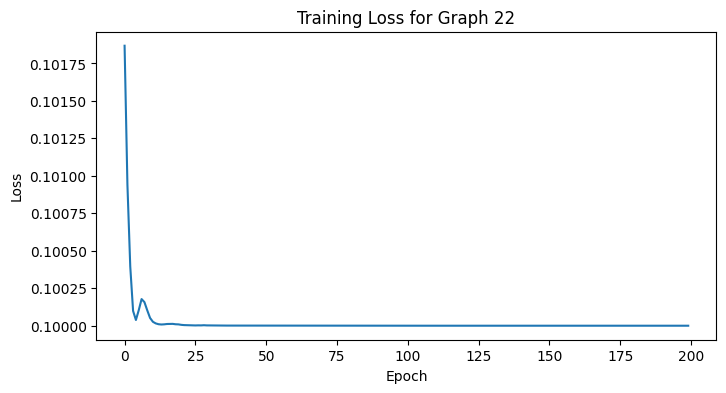

tensor([[0.0497, 0.0500, 0.0502, 0.0497, 0.0493, 0.0499, 0.0499, 0.0502, 0.0503,
         0.0501],
        [0.0497, 0.0496, 0.0498, 0.0499, 0.0491, 0.0499, 0.0499, 0.0501, 0.0499,
         0.0500],
        [0.0497, 0.0500, 0.0501, 0.0499, 0.0493, 0.0500, 0.0499, 0.0501, 0.0502,
         0.0500],
        [0.0497, 0.0501, 0.0502, 0.0500, 0.0493, 0.0501, 0.0499, 0.0500, 0.0501,
         0.0499],
        [0.0497, 0.0499, 0.0501, 0.0500, 0.0492, 0.0501, 0.0500, 0.0500, 0.0500,
         0.0499],
        [0.0496, 0.0497, 0.0500, 0.0500, 0.0492, 0.0500, 0.0500, 0.0501, 0.0500,
         0.0500],
        [0.0496, 0.0501, 0.0505, 0.0499, 0.0495, 0.0500, 0.0500, 0.0502, 0.0506,
         0.0501]])
[[0.09998064 0.10000303 0.10002857 0.09997765 0.09993644 0.09999827
  0.09999783 0.10002419 0.10004017 0.10001312]
 [0.09999259 0.09998175 0.10000345 0.10000914 0.09992871 0.10000771
  0.10000902 0.10003232 0.10001065 0.10002464]
 [0.09997635 0.10000561 0.10002118 0.10000122 0.09993824 0.10001184
  0.1000

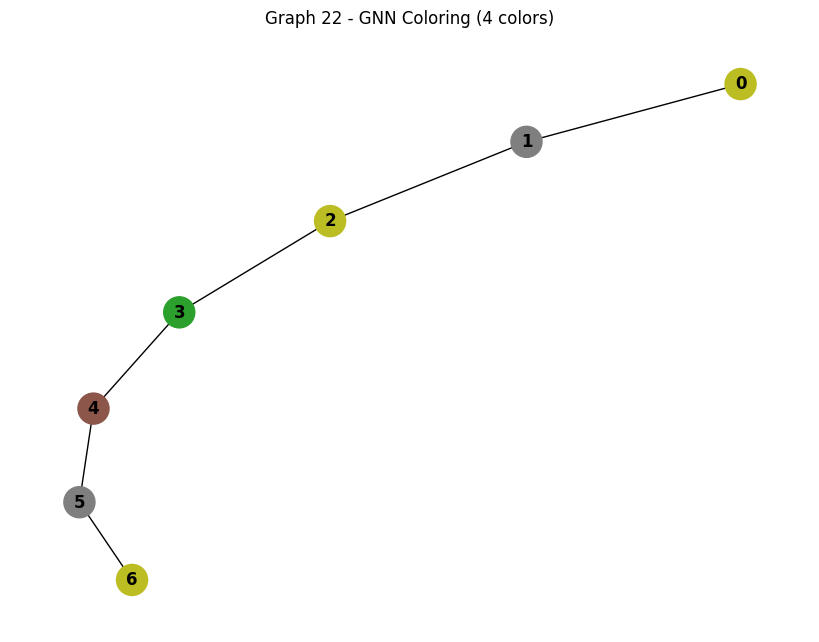

In [13]:
gnn_execution_times = []
gnn_results = []
for i, data in enumerate(example_data):
    print(f"\nTraining GNN for Graph {i+1}")
    start_time = time.time()
    model, losses = train_gnn_coloring(data, hidden_channels=32, max_colors=10, epochs=200)
    end_time = time.time()
    execution_time = end_time - start_time
    print(f"GNN training execution time: {execution_time:.4f} seconds")
    gnn_execution_times.append(execution_time)
    plt.figure(figsize=(8, 4))
    plt.plot(losses)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Training Loss for Graph {i+1}')
    plt.show()

    colors = model.predict_colors(data.x, data.edge_index)
    num_colors = len(set(colors))

    print(f"GNN coloring for Graph {i+1} uses {num_colors} colors")
    print(f"Color assignments: {colors}")

    visualize_graph(data, title=f"Graph {i+1} - GNN Coloring ({num_colors} colors)", node_colors=colors)

    gnn_results.append((colors, num_colors))

In [14]:
def verify_coloring(data, colors):
    edge_index = data.edge_index
    conflicts = []

    for i in range(edge_index.shape[1]):
        src, dst = edge_index[0, i].item(), edge_index[1, i].item()
        if colors[src] == colors[dst]:
            conflicts.append((src, dst))

    is_valid = len(conflicts) == 0
    return is_valid, conflicts

## Comparison: Greedy and GNN Coloring Results


In [15]:
for i, data in enumerate(example_data):
    start_time = time.time()
    greedy_colors, greedy_num_colors = greedy_coloring(data)
    end_time = time.time()
    execution_time = end_time - start_time
    print(f"Greedy coloring execution time: {execution_time:.4f} seconds")
    gnn_colors, gnn_num_colors = gnn_results[i]

    print(f"Graph {i+1} comparison:")
    print(f"  - Greedy algorithm: {greedy_num_colors} colors")
    print(f"  - GNN approach: {gnn_num_colors} colors")

    greedy_valid, greedy_conflicts = verify_coloring(data, greedy_colors)
    gnn_valid, gnn_conflicts = verify_coloring(data, gnn_colors)

    print(f"  - Greedy coloring valid: {greedy_valid}")
    print(f"  - GNN coloring valid: {gnn_valid}")

    if not greedy_valid:
        print(f"    Greedy conflicts: {greedy_conflicts}")
    if not gnn_valid:
        print(f"    GNN conflicts: {gnn_conflicts}")

    print()

print("GNN training execution times (seconds) for each graph:")
for i, t in enumerate(gnn_execution_times):
    print(f"  Graph {i+1}: {t:.4f} seconds")

Greedy coloring execution time: 0.9733 seconds
Graph 1 comparison:
  - Greedy algorithm: 213 colors
  - GNN approach: 207 colors
  - Greedy coloring valid: True
  - GNN coloring valid: True

  - Greedy coloring valid: True
  - GNN coloring valid: True

Greedy coloring execution time: 0.6053 seconds
Graph 2 comparison:
  - Greedy algorithm: 123 colors
  - GNN approach: 123 colors
Greedy coloring execution time: 0.6053 seconds
Graph 2 comparison:
  - Greedy algorithm: 123 colors
  - GNN approach: 123 colors
  - Greedy coloring valid: True
  - GNN coloring valid: True

Greedy coloring execution time: 0.0022 seconds
Graph 3 comparison:
  - Greedy algorithm: 11 colors
  - GNN approach: 11 colors
  - Greedy coloring valid: True
  - GNN coloring valid: True

Greedy coloring execution time: 0.0230 seconds
Graph 4 comparison:
  - Greedy algorithm: 2 colors
  - GNN approach: 2 colors
  - Greedy coloring valid: True
  - GNN coloring valid: True

Greedy coloring execution time: 0.0000 seconds
Grap

## Summary

In this notebook, we've explored two approaches to graph coloring:

1. **Greedy Algorithm**:
   - Simple and fast
   - Processes nodes in order of degree (most connected first)
   - Assigns the smallest available color to each node

2. **Graph Neural Network (GNN)**:
   - More sophisticated approach using deep learning
   - Learns node embeddings that capture graph structure
   - Uses a custom loss function to encourage proper coloring
   - Can potentially find better colorings for complex graphs

Both approaches ensure that no adjacent nodes have the same color, which is the fundamental requirement of graph coloring.

In [17]:
greedy_colors = []
greedy_times = []
for data in example_data:
    start = time.time()
    _, num_colors = greedy_coloring(data)
    end = time.time()
    greedy_colors.append(num_colors)
    greedy_times.append(round(end - start, 4))

gnn_colors = [r[1] for r in gnn_results]
gnn_times = gnn_execution_times

print("greedy_colors =", greedy_colors)
print("greedy_times =", greedy_times)
print("gnn_colors =", gnn_colors)
print("gnn_times =", gnn_times)

greedy_colors = [213, 123, 11, 2, 64, 2, 71, 3, 25, 7, 2, 2, 16, 14, 47, 51, 74, 2, 2, 2, 2, 2]
greedy_times = [0.7094, 0.5867, 0.0, 0.0295, 0.0, 0.0, 0.1127, 0.0009, 0.0, 0.0011, 0.0, 0.0, 0.0044, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
gnn_colors = [207, 123, 11, 2, 64, 2, 71, 3, 25, 8, 3, 2, 16, 13, 47, 51, 74, 3, 2, 2, 2, 4]
gnn_times = [11705.672673225403, 31.694096326828003, 1.8973257541656494, 47.924680948257446, 1.5516057014465332, 1.0835151672363281, 7.727129697799683, 1.1531226634979248, 1.1280014514923096, 1.1955296993255615, 1.0906500816345215, 1.1666977405548096, 1.8950467109680176, 1.6890769004821777, 1.4791834354400635, 1.6093165874481201, 1.7870259284973145, 1.2496795654296875, 1.2883124351501465, 2.4037699699401855, 1.1568243503570557, 1.3754441738128662]
